In [1]:
%matplotlib notebook
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import numpy.ma as ma
import glob
from collections import namedtuple, OrderedDict
import netCDF4 as nc
import os
import scipy
import scipy.io as sio
from scipy import interpolate, signal
from pyproj import Proj,transform
import sys
sys.path.append('/ocean/ssahu/CANYONS/wcvi/grid/')
from bathy_common import *
from matplotlib import path
from salishsea_tools import viz_tools
import xarray as xr
from salishsea_tools import nc_tools
import scipy.io as sio
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.cm as cm
import cmocean as cmo
import matplotlib.gridspec as gridspec
%matplotlib inline
from scipy.io import loadmat
from scipy.interpolate import griddata
from dateutil.parser import parse
from salishsea_tools import geo_tools, viz_tools, tidetools, nc_tools
import gsw
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Ellipse
import matplotlib as mpl

import seaborn as sns
from windrose import plot_windrose
from windrose import WindroseAxes


from dateutil        import parser
from datetime import datetime

import numpy.ma as ma

sns.set_context('talk')
sns.set_style('darkgrid')

/home/ssahu/anaconda3/lib/python3.5/site-packages/xarray/conventions.py:9: FutureWarning: The pandas.tslib module is deprecated and will be removed in a future version.
  from pandas.tslib import OutOfBoundsDatetime


In [80]:
from IPython.display import HTML

HTML('''<script>
code_show=true; 
function code_toggle() {
 if (code_show){
 $('div.input').hide();
 } else {
 $('div.input').show();
 }
 code_show = !code_show
} 
$( document ).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

In [2]:
zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



nc_file = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/isopyncal_263/right_traj_all_down.nc')
nc_tools.show_variables(nc_file)

odict_keys(['init_x', 'init_y', 'init_z', 'init_t', 'init_age', 'init_transp', 'final_x', 'final_y', 'final_z', 'final_t', 'final_age', 'final_transp', 'traj_lon', 'traj_lat', 'traj_depth', 'traj_time', 'traj_temp', 'traj_salt', 'traj_dens'])


In [8]:
zlevels[25]

186.12556

In [9]:


init_x = nc_file.variables['init_x']
init_z = nc_file.variables['init_z']
init_age = nc_file.variables['init_age']

traj_depth = nc_file.variables['traj_depth'][:]
traj_lon   = nc_file.variables['traj_lon'][:]
traj_lat   = nc_file.variables['traj_lat'][:]
traj_rho   = nc_file.variables['traj_dens'][:]
traj_tem   = nc_file.variables['traj_temp'][:]
traj_sal   = nc_file.variables['traj_salt'][:]
traj_time  = nc_file.variables['traj_time']


final_age = nc_file.variables['final_age']


# lon1=nc_file.variables['traj_lon'][:]
# lat1=nc_file.variables['traj_lat'][:]
# dep1=nc_file.variables['traj_depth'][:]
x1=nc_file.variables['init_x'][:]
y1=nc_file.variables['init_y'][:]
t1=nc_file.variables['traj_time'][:]

x_low = x1
y_low = y1

x2=nc_file.variables['final_x'][:]
y2=nc_file.variables['final_y'][:]


final_z = nc_file.variables['final_z'][:]

final_age_days = final_age[:]/(3600)

/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:10: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type


In [10]:
x_final = []
y_final = []


for i in np.arange(x2.shape[0]):
    x_final = np.append(arr=x_final,values=x_wcvi_slice[np.int(np.rint(x2[i]))-1])
    y_final = np.append(arr=y_final,values=y_wcvi_slice[np.int(np.rint(y2[i]))-1])

In [11]:
def plot_particle_track(particle_ind):
    
    part = particle_ind
    
    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon'][...]
    lat = bathy['nav_lat'][...]



    file_model = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/cut_NEP36-S29_1d_20130429_20131025_grid_T_20130429-20130508.nc')

    lon_small = file_model.variables['nav_lon'][1:,1:]
    lat_small = file_model.variables['nav_lat'][1:,1:]




#     cmap=plt.cm.get_cmap('nipy_spectral')
    cmap = plt.cm.get_cmap('gist_rainbow_r')
    cmap.set_bad('#8b7765')
    cmin = 0
    cmax = 300

    import matplotlib as mpl
    #     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

    fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
    CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
    CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


    # part = ind[0]
    # for part in ind[139]:

    for k in np.arange(0,np.int(final_age_days[part]),10):
        y, x = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
        track1 = ax.scatter(x_wcvi_slice[np.int(np.rint(x1[part]))-1], y_wcvi_slice[np.int(np.rint(y1[part]))-1], s=500, marker = '*', c = 'magenta', alpha=0.9, edgecolor= 'orangered')
        q = ax.scatter(x, y, c = np.multiply(-1,np.ma.array(traj_depth[k,part]).filled()), cmap = cmap, vmin = cmin, vmax= cmax, s=100, alpha=0.9)#, edgecolor= 'cyan')

        t = np.int(np.rint(120 - traj_time[k,part]*120))
        level = np.int(np.rint((np.abs(zlevels - (-traj_depth[k,part]))).argmin()))



        j, i = geo_tools.find_closest_model_point(traj_lon[k,part],traj_lat[k,part],\
                                                  lon_small,lat_small,grid='NEMO',tols=\
                                                  {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                                   'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 


    #     quiver = ax.quiver(x_wcvi_slice[::arrow_step], y_wcvi_slice[::arrow_step], u_rho_0[::arrow_step,::arrow_step], v_rho_0[::arrow_step,::arrow_step] , speeds[::arrow_step,::arrow_step], pivot='mid', cmap = cmap, width=0.005, minshaft= 0.5)
    #     quiver = ax.quiver(x, y, u_tzyx_loc, v_tzyx_loc , color = 'blue', cmap = cmap, pivot='tail', width=0.003, minshaft= 0.5)
    # #     legend = ax.legend(loc='best', fancybox=True, framealpha=0.25, fontsize =16)
    # ax.quiverkey(quiver, 610, 320,  0.1, r'0.1 m/sec', coordinates = 'data')

    ax.set_xlabel('x index', fontsize =16)
    ax.set_ylabel('y index', fontsize = 16)
    ax.tick_params(axis='both',labelsize =16)


    # ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
    ax.legend(loc = 'best')

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

    ax.grid()

    cbar = fig.colorbar(q, ax=ax)
    cbar.set_label(label='Depth ($m$)', fontsize = 16)
    cbar.ax.tick_params(labelsize=16)
    fig.tight_layout()
    
    
    
def plot_pie_diagram(off_percentage, south_percentage, cuc_percentage, juan_percentage, north_percentage):

    bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

    Z = bathy.variables['Bathymetry']


    lon = bathy['nav_lon'][...]
    lat = bathy['nav_lat'][...]




    cmap=plt.cm.get_cmap('nipy_spectral')
    #     cmap = plt.cm.get_cmap('gist_rainbow')
    cmap.set_bad('#8b7765')
    cmin = 0
    cmax = 300

    import matplotlib as mpl
    #     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

    fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
    CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
    CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
    CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
    CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



    ax.set_xlabel('x index', fontsize =16)
    ax.set_ylabel('y index', fontsize = 16)
    ax.tick_params(axis='both',labelsize =16)
    for k in np.arange(x1.shape[0]):
        ax.scatter(x_wcvi_slice[np.int(x1[k]-1)],y_wcvi_slice[np.int(y1[k]-1)], marker = '*', c = 'red', s = 10, linewidths=3)
    

    # ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
    ax.legend(loc = 'best')

    viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
    viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

    x = [520,575]
    y = [320,200]
    ax.plot(x, y , 'bo-')


    ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
    ax.hlines(y = 320, xmin = 520, xmax=590, color = 'b')
    ax.grid()

    axins = inset_axes(ax, width="50%", height="75%",
                       bbox_to_anchor=(.085, .15, .5, .5),
                       bbox_transform=ax.transAxes, loc=3)
    axins.tick_params(
        axis='x',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)

    axins.tick_params(
        axis='y',          # changes apply to the x-axis
        which='both',      # both major and minor ticks are affected
        bottom=False,      # ticks along the bottom edge are off
        top=False,         # ticks along the top edge are off
        labelbottom=False)


    labels = 'Offshore', 'From South', 'CUC','Strait outflow', 'From North', 'Shelf water'
    sizes = [off_percentage, south_percentage, cuc_percentage, juan_percentage, north_percentage, \
             100- (off_percentage + south_percentage + cuc_percentage + juan_percentage + north_percentage)]
    explode = (0, 0.1, 0.1, 0, 0, 0)  # only "explode" the 2nd slice (i.e. 'Hogs')


    size = 0.35
    vals = np.array([[9.5, 0], [10.2, 0], [12.3, 0], [25.4, 51.7-25.4]])

    cmap = plt.get_cmap("tab20c")
    outer_colors = cmap(np.arange(4)*4)
    inner_colors = cmap(np.arange(5)*4)#cmap(np.array([1, 4, 7, 10, 13, 25]))

    axins.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
            shadow=True, startangle=90)
    axins.axis('equal') 
    ax.vlines(x = 648, ymin = 255, ymax = 271, color = 'blue')

    fig.tight_layout()
    
    
def get_cov_ellipse(cov, centre, nstd, **kwargs):
    """
    Return a matplotlib Ellipse patch representing the covariance matrix
    cov centred at centre and scaled by the factor nstd.

    """

    # Find and sort eigenvalues and eigenvectors into descending order
    eigvals, eigvecs = np.linalg.eigh(cov)
    order = eigvals.argsort()[::-1]
    eigvals, eigvecs = eigvals[order], eigvecs[:, order]

    # The anti-clockwise angle to rotate our ellipse by 
    vx, vy = eigvecs[:,0][0], eigvecs[:,0][1]
    theta = np.arctan2(vy, vx)

    # Width and height of ellipse to draw
    width, height = 2 * nstd * np.sqrt(eigvals)
    return Ellipse(xy=centre, width=width, height=height,
                   angle=np.degrees(theta), **kwargs)


def find_index(k):
    
    indice = np.zeros(final_age.shape[0])
    
    for m in np.arange(traj_lon.shape[1]):

        y, x = geo_tools.find_closest_model_point(traj_lon[k,m],traj_lat[k,m],\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})
        y1,x1 = geo_tools.find_closest_model_point(traj_lon[k-500,m],traj_lat[k-500,m],\
                                      lon,lat,grid='NEMO',tols=\
                                      {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                       'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}})

        bbox = mpl.transforms.Bbox(points=[(x,y), (x1,y1)]) 

        if (mpl.path.Path(vertices=vert).intersects_bbox(bbox, filled=True)) == True:
            
            indice[m] = m

        else:
            continue

    indexes = np.array(np.nonzero(indice))
    
    return indexes[0]


def density_scatter( x , y, ax = None, sort = True, bins = 20, **kwargs )   :
    """
    Scatter plot colored by 2d histogram
    """
    if ax is None :
        fig , ax = plt.subplots()
    data , x_e, y_e = np.histogram2d( x, y, bins = bins)
    z = interpn( ( 0.5*(x_e[1:] + x_e[:-1]) , 0.5*(y_e[1:]+y_e[:-1]) ) , data , np.vstack([x,y]).T , method = "splinef2d", bounds_error = False )

    # Sort the points by density, so that the densest points are plotted last
    if sort :
        idx = z.argsort()
        x, y, z = x[idx], y[idx], z[idx]

    ax.scatter(x, y, c=z, **kwargs)
    return ax


def mixing(T, S, inds):
    """
    Compute the water mass mixing percentage using Mamayev's (1975) mixing
    triangle.

    Parameters
    ----------
    T : Conservative Temperature
    S : Absolute Salinity
    inds :  2x3 array with thermohaline indices
            [T1 T2 T3
            S1 S2 S3]

    Returns
    -------
    m1, m2, m3 : Water mass percentage for masses 1, 2 e 3.

    """

    a = np.r_[inds, np.ones((1, 3))]
    b = np.c_[T.ravel(), S.ravel(), np.ones(T.shape).ravel()].T
    m = np.linalg.solve(a, b)
    m1 = m[0].reshape(T.shape)
    m2 = m[1].reshape(T.shape)
    m3 = m[2].reshape(T.shape)

    # Mask values outside mixing triangle.
    m1 = ma.masked_outside(ma.masked_invalid(m1), 0, 1)
    m2 = ma.masked_outside(ma.masked_invalid(m2), 0, 1)
    m3 = ma.masked_outside(ma.masked_invalid(m3), 0, 1)

    m1 = 100 * m1
    m2 = 100 * m2
    m3 = 100 * m3
    return m1, m2, m3


In [12]:
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

p1= (x[0],y[0])
p1 = np.asarray(p1)
p2 = (x[1], y[1])
p2 = np.asarray(p2)



d = np.empty_like(x_final)

off_ind = []


for r in np.arange(x_final.shape[0]):

    p3 = (x_final[r], y_final[r])
    p3 = np.asarray(p3)
    d[r] =np.cross(p2-p1,p3-p1)/np.linalg.norm(p2-p1)
    
    if ((d[r] < 0) & (x_final[r] < 575)):
        off_ind = np.append(arr=off_ind, values=np.int(r))

In [87]:
num_north = np.round(a=final_age[(x_final < 580) & (y_final > 300)].shape[0]/final_z.shape[0], decimals=3)

north_percent = 100*num_north

print(north_percent)

num_cuc = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0].shape[0]/final_z.shape[0], decimals = 3)

cuc_percent = 100*num_cuc

print(cuc_percent)

num_south = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0].shape[0]/final_z.shape[0], decimals = 3)

south_percent = 100*num_south

print(south_percent)

### Bigger box
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

num_off = off_ind.shape[0]/final_z.shape[0]
off_percent = np.round(a=100*num_off, decimals=1)

print(off_percent)

num_juan = np.round(a=np.where((x_final > 648))[0].shape[0]/final_z.shape[0], decimals=3)

juan_percent = num_juan*100

print(juan_percent)

6.4
12.8
33.6
9.0
3.7


In [88]:
cuc_percent_low = cuc_percent
juan_percent_low = juan_percent
north_percent_low = north_percent
south_percent_low = south_percent
off_percent_low = off_percent



For particles rightly predicted by model on 26.3 isopycncal and below


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/figure.py:1743: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


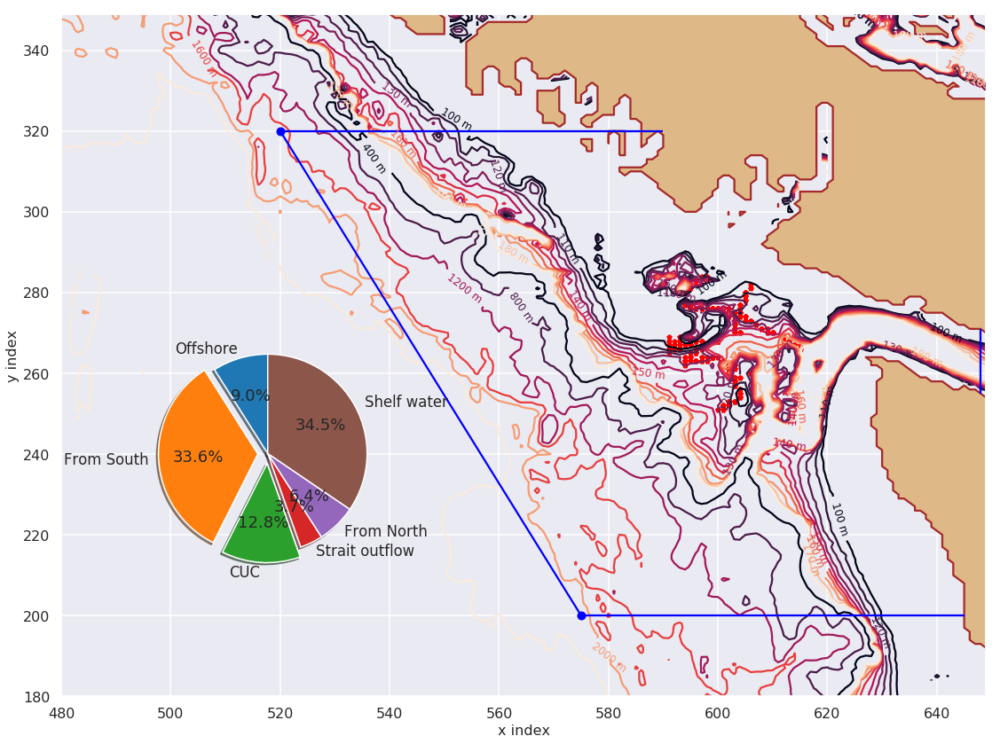

In [8]:
print("For particles rightly predicted by model on 26.3 isopycncal and below")


plot_pie_diagram(cuc_percentage=cuc_percent, juan_percentage=juan_percent, \
                 north_percentage=north_percent, south_percentage=south_percent, \
                 off_percentage=off_percent)

In [89]:
traj_tem_last   = np.empty_like(final_age_days)
traj_sal_last   = np.empty_like(final_age_days)
traj_rho_last   = np.empty_like(final_age_days)
traj_depth_last = np.empty_like(final_age_days)


traj_tem_init   = np.empty_like(final_age_days)
traj_sal_init   = np.empty_like(final_age_days)
traj_rho_init   = np.empty_like(final_age_days)
traj_depth_init = np.empty_like(final_age_days)

for r in np.arange(traj_tem_last.shape[0]):
    traj_tem_last[r]  =  traj_tem[np.int(final_age_days[r]),r]
    traj_sal_last[r]  =  traj_sal[np.int(final_age_days[r]),r]
    traj_rho_last[r]  =  traj_rho[np.int(final_age_days[r]),r]
    traj_depth_last[r] = traj_depth[np.int(final_age_days[r]),r]
    
    traj_tem_init[r]  =  traj_tem[0,r]
    traj_sal_init[r]  =  traj_sal[0,r]
    traj_rho_init[r]  =  traj_rho[0,r]    
    traj_depth_init[r]=  traj_depth[0,r] 
    

In [90]:
max_life_ind = np.array(np.where(final_age_days == np.max(final_age_days))[0])

off_ind   = off_ind
north_ind = np.where([(x_final < 580) & (y_final > 300)])[1]
south_ind = []
cuc_ind   = []


ind_all_south  = np.where(((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200)))[0]

for k in ind_all_south:
    if final_z[k] <= 28:
        south_ind = np.append(arr=south_ind, values= k)
        
    if final_z[k] > 28:
        cuc_ind = np.append(arr=cuc_ind, values=k)
        

juan_ind =  np.where((x_final > 648))[0]

non_local_ind = np.concatenate((off_ind, north_ind, south_ind, cuc_ind, juan_ind))

ind_local = np.setdiff1d(max_life_ind, np.unique(non_local_ind, return_index= False).astype(int), assume_unique=True)

# off_ind/

# ind_local = np.setdiff1d(max_life_ind, off_ind, assume_unique= True)

x_local_low_actual = x2[ind_local]
y_local_low_actual = y2[ind_local]

depth_local_low_actual = -traj_depth_last[ind_local]


In [11]:
count_ind = np.concatenate((ind_local, np.unique(non_local_ind, return_index= False).astype(int)))

count_ind.shape[0]/final_z.shape[0]

0.9822033898305085

In [12]:
absent_ind  = np.setdiff1d(np.arange(final_z.shape[0]), count_ind)

In [13]:
absent_ind

array([  10,   16,  264,  269,  278,  345,  350,  620,  625,  630,  698,
        703,  754,  759,  797,  828,  880,  886, 1167, 1171, 1175])

In [16]:
absent_ind.shape[0]/final_z.shape[0]

0.017796610169491526

In [91]:

traj_tem_final_cuc = traj_tem_last[cuc_ind.astype(int)]
traj_sal_final_cuc = traj_sal_last[cuc_ind.astype(int)]
traj_rho_final_cuc = traj_rho_last[cuc_ind.astype(int)]
traj_depth_final_cuc = traj_depth_last[cuc_ind.astype(int)]
traj_days_final_cuc = final_age_days[cuc_ind.astype(int)]/24



traj_tem_final_north = traj_tem_last[north_ind.astype(int)]
traj_sal_final_north = traj_sal_last[north_ind.astype(int)]
traj_rho_final_north = traj_rho_last[north_ind.astype(int)]
traj_depth_final_north = traj_depth_last[north_ind.astype(int)]
traj_days_final_north = final_age_days[north_ind.astype(int)]/24



traj_tem_final_south   = traj_tem_last[south_ind.astype(int)]
traj_sal_final_south   = traj_sal_last[south_ind.astype(int)]
traj_rho_final_south   = traj_rho_last[south_ind.astype(int)]
traj_depth_final_south = traj_depth_last[south_ind.astype(int)]
traj_days_final_south  = final_age_days[south_ind.astype(int)]/24


traj_tem_final_juan = traj_tem_last[juan_ind.astype(int)]
traj_sal_final_juan = traj_sal_last[juan_ind.astype(int)]
traj_rho_final_juan = traj_rho_last[juan_ind.astype(int)]
traj_depth_final_juan = traj_depth_last[juan_ind.astype(int)]
traj_days_final_juan = final_age_days[juan_ind.astype(int)]/24


traj_tem_final_local = traj_tem_last[ind_local.astype(int)]
traj_sal_final_local = traj_sal_last[ind_local.astype(int)]
traj_rho_final_local = traj_rho_last[ind_local.astype(int)]
traj_depth_final_local = traj_depth_last[ind_local.astype(int)]
traj_days_final_local = final_age_days[ind_local.astype(int)]/24




x = [510,575]
y = [320,200]

coefficients = np.polyfit(x, y, 1)
x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

traj_tem_final_off = []
traj_sal_final_off = []
traj_rho_final_off = []
traj_depth_final_off = []
traj_days_final_off = []

for l in np.arange(off_ind.shape[0]):

    traj_depth_final_off = np.append(arr=traj_depth_final_off, values=traj_depth_last[np.int(off_ind[l])])
    traj_days_final_off = np.append(arr=traj_days_final_off, values=final_age_days[np.int(off_ind[l])]/24)
    traj_rho_final_off   = np.append(arr=traj_rho_final_off, values=traj_rho_last[np.int(off_ind[l])])
    traj_tem_final_off   = np.append(arr=traj_tem_final_off, values=traj_tem_last[np.int(off_ind[l])])
    traj_sal_final_off   = np.append(arr=traj_sal_final_off, values=traj_sal_last[np.int(off_ind[l])])


In [92]:
pressure_loc_cuc = np.empty_like(traj_depth_final_cuc)
SA_loc_cuc       = np.empty_like(traj_depth_final_cuc)
CT_loc_cuc       = np.empty_like(traj_depth_final_cuc)
spic_loc_cuc     = np.empty_like(traj_depth_final_cuc)



for i in np.arange(traj_depth_final_cuc.shape[0]):
    
    pressure_loc_cuc[i] = gsw.p_from_z(traj_depth_final_cuc[i],np.mean(traj_lat))
    
    SA_loc_cuc[i] = gsw.SA_from_SP(traj_sal_final_cuc[i], pressure_loc_cuc[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_cuc[i] = gsw.CT_from_pt(traj_sal_final_cuc[i], traj_tem_final_cuc[i])
    
    spic_loc_cuc[i] = gsw.spiciness0(SA_loc_cuc[i], CT_loc_cuc[i])
    
pressure_loc_off = np.empty_like(traj_depth_final_off)
SA_loc_off       = np.empty_like(traj_depth_final_off)
CT_loc_off       = np.empty_like(traj_depth_final_off)
spic_loc_off     = np.empty_like(traj_depth_final_off)



for i in np.arange(traj_depth_final_off.shape[0]):
    
    pressure_loc_off[i] = gsw.p_from_z(traj_depth_final_off[i],np.mean(traj_lat))
    
    SA_loc_off[i] = gsw.SA_from_SP(traj_sal_final_off[i], pressure_loc_off[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_off[i] = gsw.CT_from_pt(traj_sal_final_off[i], traj_tem_final_off[i])
    
    spic_loc_off[i] = gsw.spiciness0(SA_loc_off[i], CT_loc_off[i])
    
pressure_loc_south = np.empty_like(traj_depth_final_south)
SA_loc_south       = np.empty_like(traj_depth_final_south)
CT_loc_south       = np.empty_like(traj_depth_final_south)
spic_loc_south     = np.empty_like(traj_depth_final_south)



for i in np.arange(traj_depth_final_south.shape[0]):
    
    pressure_loc_south[i] = gsw.p_from_z(traj_depth_final_south[i],np.mean(traj_lat))
    
    SA_loc_south[i] = gsw.SA_from_SP(traj_sal_final_south[i], pressure_loc_south[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_south[i] = gsw.CT_from_pt(traj_sal_final_south[i], traj_tem_final_south[i])
    
    spic_loc_south[i] = gsw.spiciness0(SA_loc_south[i], CT_loc_south[i])
    
pressure_loc_north= np.empty_like(traj_depth_final_north)
SA_loc_north       = np.empty_like(traj_depth_final_north)
CT_loc_north       = np.empty_like(traj_depth_final_north)
spic_loc_north     = np.empty_like(traj_depth_final_north)



for i in np.arange(traj_depth_final_north.shape[0]):
    
    pressure_loc_north[i] = gsw.p_from_z(traj_depth_final_north[i],np.mean(traj_lat))
    
    SA_loc_north[i] = gsw.SA_from_SP(traj_sal_final_north[i], pressure_loc_north[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_north[i] = gsw.CT_from_pt(traj_sal_final_north[i], traj_tem_final_north[i])
    
    spic_loc_north[i] = gsw.spiciness0(SA_loc_north[i], CT_loc_north[i])
    

pressure_loc_juan= np.empty_like(traj_depth_final_juan)
SA_loc_juan       = np.empty_like(traj_depth_final_juan)
CT_loc_juan       = np.empty_like(traj_depth_final_juan)
spic_loc_juan     = np.empty_like(traj_depth_final_juan)



for i in np.arange(traj_depth_final_juan.shape[0]):
    
    pressure_loc_juan[i] = gsw.p_from_z(traj_depth_final_juan[i],np.mean(traj_lat))
    
    SA_loc_juan[i] = gsw.SA_from_SP(traj_sal_final_juan[i], pressure_loc_juan[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_juan[i] = gsw.CT_from_pt(traj_sal_final_juan[i], traj_tem_final_juan[i])
    
    spic_loc_juan[i] = gsw.spiciness0(SA_loc_juan[i], CT_loc_juan[i])
    

In [93]:

pressure_loc_init = np.empty_like(traj_tem_init)
SA_loc_init       = np.empty_like(traj_depth_init)
CT_loc_init       = np.empty_like(traj_depth_init)
spic_loc_init     = np.empty_like(traj_depth_init)



for i in np.arange(traj_depth_init.shape[0]):
    
    pressure_loc_init[i] = gsw.p_from_z(traj_depth_init[i],np.mean(traj_lat))
    
    SA_loc_init[i] = gsw.SA_from_SP(traj_sal_init[i], pressure_loc_init[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_init[i] = gsw.CT_from_pt(traj_sal_init[i], traj_tem_init[i])
    
    spic_loc_init[i] = gsw.spiciness0(SA_loc_init[i], CT_loc_init[i])
    
    
pressure_loc_local = np.empty_like(traj_depth_final_local)
SA_loc_local       = np.empty_like(traj_depth_final_local)
CT_loc_local       = np.empty_like(traj_depth_final_local)
spic_loc_local     = np.empty_like(traj_depth_final_local)



for i in np.arange(traj_depth_final_local.shape[0]):
    
    pressure_loc_local[i] = gsw.p_from_z(traj_depth_final_local[i],np.mean(traj_lat))
    
    SA_loc_local[i] = gsw.SA_from_SP(traj_sal_final_local[i], pressure_loc_local[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_local[i] = gsw.CT_from_pt(traj_sal_final_local[i], traj_tem_final_local[i])
    
    spic_loc_local[i] = gsw.spiciness0(SA_loc_local[i], CT_loc_local[i])    
    

In [94]:
sns.set_context('poster')
sns.set_style('dark')

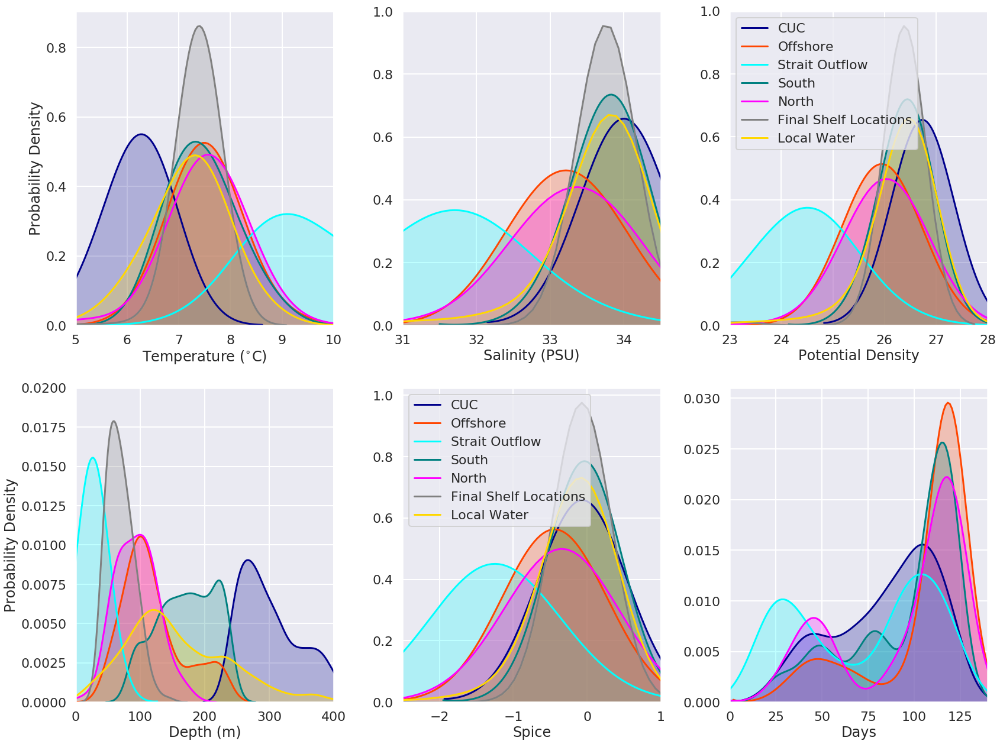

In [51]:
df = pd.DataFrame()

d = 1
local_percent = (ind_local.shape[0]/final_z.shape[0])*100

df['Density CUC']     = traj_rho_final_cuc
df['Temperature CUC'] = traj_tem_final_cuc
df['Salinity CUC']    = traj_sal_final_cuc
df['Spice CUC']       = spic_loc_cuc
df['Depth CUC']       = -traj_depth_final_cuc

dp = pd.DataFrame()

dp['Density OFF']     = traj_rho_final_off
dp['Temperature OFF'] = traj_tem_final_off
dp['Salinity OFF']    = traj_sal_final_off
dp['Spice OFF']       = spic_loc_off
dp['Depth OFF']       = -traj_depth_final_off

dg = pd.DataFrame()

dg['Density South']     = traj_rho_final_south
dg['Temperature South'] = traj_tem_final_south
dg['Salinity South']    = traj_sal_final_south
dg['Spice South']       = spic_loc_south
dg['Depth South']       = -traj_depth_final_south

dh = pd.DataFrame()

dh['Density Juan']     = traj_rho_final_juan
dh['Temperature Juan'] = traj_tem_final_juan
dh['Salinity Juan']    = traj_sal_final_juan
dh['Spice Juan']       = spic_loc_juan
dh['Depth Juan']       = -traj_depth_final_juan


dq = pd.DataFrame()

dq['Density North']     = traj_rho_final_north
dq['Temperature North'] = traj_tem_final_north
dq['Salinity North']    = traj_sal_final_north
dq['Spice North']       = spic_loc_north
dq['Depth North']       = -traj_depth_final_north


da = pd.DataFrame()

da['Density Init']     = traj_rho_init
da['Temperature Init'] = traj_tem_init
da['Salinity Init']    = traj_sal_init
da['Spice Init']       = spic_loc_init
da['Depth Init']       = -traj_depth_init

dj = pd.DataFrame()

dj['Density Local']     = traj_rho_final_local
dj['Temperature Local'] = traj_tem_final_local
dj['Salinity Local']    = traj_sal_final_local
dj['Spice Local']       = spic_loc_local
dj['Depth Local']       = -traj_depth_final_local


fig, (ax1,ax2) = plt.subplots(2,3, figsize=(24,18), sharey = False)

q = sns.kdeplot(df['Temperature CUC'], ax = ax1[0],bw=(cuc_percent**(-1./(d+4))),shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Temperature OFF'], ax = ax1[0], bw=(off_percent**(-1./(d+4))),shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Temperature Juan'], ax = ax1[0], bw=(juan_percent**(-1./(d+4))), shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Temperature South'], ax = ax1[0], bw=(south_percent**(-1./(d+4))),shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Temperature North'], ax = ax1[0], bw=(north_percent**(-1./(d+4))),shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Temperature Init'], ax = ax1[0], bw =(100**(-1./(d+4))), shade=True, color = 'Gray', label = None)

sns.kdeplot(dj['Temperature Local'], ax = ax1[0], bw =(local_percent**(-1./(d+4))), shade=True, color = 'Gold', label = None)


ax1[0].set_xlim(5,10)
ax1[0].set_xlabel('Temperature ($^{\circ}$C)')
ax1[0].set_ylabel('Probability Density')
ax1[0].get_legend().remove()
ax1[0].grid()


q = sns.kdeplot(df['Salinity CUC'], ax = ax1[1], bw=(cuc_percent**(-1./(d+4))),  shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Salinity OFF'], ax = ax1[1], bw = (off_percent**(-1./(d+4))),  shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Salinity Juan'], ax = ax1[1], bw = (juan_percent**(-1./(d+4))), shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Salinity South'], ax = ax1[1],  bw = (south_percent**(-1./(d+4))), shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Salinity North'], ax = ax1[1],bw = (north_percent**(-1./(d+4))), shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Salinity Init'], ax = ax1[1], bw = (100**(-1./(d+4))), shade=True, color = 'Gray',label = None)

sns.kdeplot(dj['Salinity Local'], ax = ax1[1], bw =(local_percent**(-1./(d+4))), shade=True, color = 'Gold', label = None)

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[1].set_xlim(31,34.5)
ax1[1].set_xlabel('Salinity (PSU)')
# ax2.set_ylabel('Density')
ax1[1].grid()
# ax1[2].legend()
ax1[1].get_legend().remove()


q = sns.kdeplot(df['Density CUC'], ax = ax1[2], bw=(cuc_percent**(-1./(d+4))), shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Density OFF'], ax = ax1[2],bw=(off_percent**(-1./(d+4))) ,shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Density Juan'], ax = ax1[2], bw=(juan_percent**(-1./(d+4))),shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Density South'], ax = ax1[2], bw=(south_percent**(-1./(d+4))), shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Density North'], ax = ax1[2], bw=(north_percent**(-1./(d+4))),shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Density Init'], ax = ax1[2], bw=(100**(-1./(d+4))), shade=True, color = 'Gray',label = 'Final Shelf Locations')

sns.kdeplot(dj['Density Local'], ax = ax1[2], bw =(local_percent**(-1./(d+4))), shade=True, color = 'Gold', label = 'Local Water')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[2].set_xlim(23,28)
ax1[2].set_xlabel('Potential Density')
# ax2.set_ylabel('Density')
ax1[2].grid()
ax1[2].legend()
# ax1[2].get_legend().remove()


q = sns.kdeplot(df['Depth CUC'], ax = ax2[0], bw=((cuc_percent/10000000)**(-1./(d+4))), shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Depth OFF'], ax = ax2[0], bw=((off_percent/10000000)**(-1./(d+4))), shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Depth South'], ax = ax2[0], bw=((south_percent/10000000)**(-1./(d+4))), shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Depth Juan'], ax = ax2[0], bw=((juan_percent/10000000)**(-1./(d+4))),  shade=True, color = 'Cyan', label = 'Staright Outflow')

sns.kdeplot(dq['Depth North'], ax = ax2[0],  bw=((north_percent/10000000)**(-1./(d+4))), shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Depth Init'], ax = ax2[0], bw=((100/10000000)**(-1./(d+4))), shade=True, color = 'Gray', label = False)

sns.kdeplot(dj['Depth Local'], ax = ax2[0], bw =(local_percent/0.05**(-1./(d+4))), shade=True, color = 'Gold', label = None)

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]


# ax2[0].legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[0].set_xlabel('Depth (m)')
ax2[0].set_ylabel('Probability Density')
ax2[0].grid()

ax2[0].set_xlim(0,400)
ax2[0].set_ylim(0,0.02)
ax2[0].get_legend().remove()


q = sns.kdeplot(df['Spice CUC'], ax = ax2[1], bw=(cuc_percent**(-1./(d+4))), shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Spice OFF'], ax = ax2[1], bw=(off_percent**(-1./(d+4))), shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Spice Juan'], ax = ax2[1], bw=(juan_percent**(-1./(d+4))), shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Spice South'], ax = ax2[1],  bw=(south_percent**(-1./(d+4))), shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Spice North'], ax = ax2[1],  bw=(north_percent**(-1./(d+4))),shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Spice Init'], ax = ax2[1], bw=(100**(-1./(d+4))), shade=True, color = 'Gray', label = 'Final Shelf Locations')

sns.kdeplot(dj['Spice Local'], ax = ax2[1], bw =(local_percent**(-1./(d+4))), shade=True, color = 'Gold', label = 'Local Water')


# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax2[1].set_xlim(-2.5,1)
ax2[1].set_xlabel('Spice')
# ax2.set_ylabel('Density')
ax2[1].grid()
ax2[1].legend()
# ax2[1].get_legend().remove()




df = pd.DataFrame()

df['Days CUC']     = traj_days_final_cuc


dp = pd.DataFrame()

dp['Days OFF']     = traj_days_final_off


dg = pd.DataFrame()

dg['Days South']     = traj_days_final_south


dh = pd.DataFrame()

dh['Days Juan']     = traj_days_final_juan

dz = pd.DataFrame()

dz['Days North']    = traj_days_final_north

dn = pd.DataFrame()

dn['Days Local'] = traj_days_final_local




q = sns.kdeplot(df['Days CUC'], ax = ax2[2],  bw=((cuc_percent/1000000)**(-1./(d+4))), shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Days OFF'], ax = ax2[2], bw=((off_percent/1000000)**(-1./(d+4))), shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Days South'], ax = ax2[2], bw=((south_percent/1000000)**(-1./(d+4))), shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Days Juan'], ax = ax2[2], bw=((juan_percent/1000000)**(-1./(d+4))), shade=True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dz['Days North'], ax = ax2[2],  bw=((north_percent/1000000)**(-1./(d+4))), shade=True, color = 'Magenta', label = 'North')

# sns.kdeplot(dn['Days Local'], ax = ax2[2], bw =(local_percent/0.001**(-1./(d+4))), shade=True, color = 'Gold', label = None)

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 



# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[2].set_xlabel('Days')
# ax1.set_ylabel('Probability Density')
ax2[2].grid()
ax2[2].get_legend().remove()
# ax2[2].legend()

ax2[2].set_xlim(0,140)

fig.tight_layout()


In [95]:
sns.set_context('talk')
sns.set_style('darkgrid')

In [32]:
n = north_percent#/100
d = 1

print(n**(-1./(d+4)))

0.689864830731


In [59]:
print((cuc_percent)**(-1./(d+4)))

0.600562216991


In [89]:
DEN

26.311104415634929

In [91]:
SPIC

-0.14505784146591641

In [92]:
T

7.4014127653220605

In [93]:
S

33.760477108790958

In [94]:
traj_sal_init.shape

(1160,)

In [111]:
final_age_days.shape

(1180,)

In [113]:
np.mean(m1)

masked

In [135]:
np.mean(m1)

masked

In [136]:
np.mean(m2)

0.62174902304067792

In [137]:
np.mean(m3)

0.46263035941835506

In [138]:
np.mean(m4)

0.0021372315771369592

In [106]:
np.mean(m5)

masked

In [86]:
m3

masked_array(data = 0.03467145830763673,
             mask = False,
       fill_value = 1e+20)

In [87]:
m4

masked_array(data = 0.21040569066254694,
             mask = False,
       fill_value = 1e+20)

In [88]:
np.mean(m5)

masked

In [52]:
m1

masked_array(data = [0.41904961711709515 0.41904961711709515 0.44417531579080877 ...,
 0.5937496620665021 0.5843143866587852 0.5580768920787647],
             mask = [False False False ..., False False False],
       fill_value = 1e+20)

In [56]:
np.min(m2)

0.031689765360226774

In [76]:
np.mean(m2)

masked

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


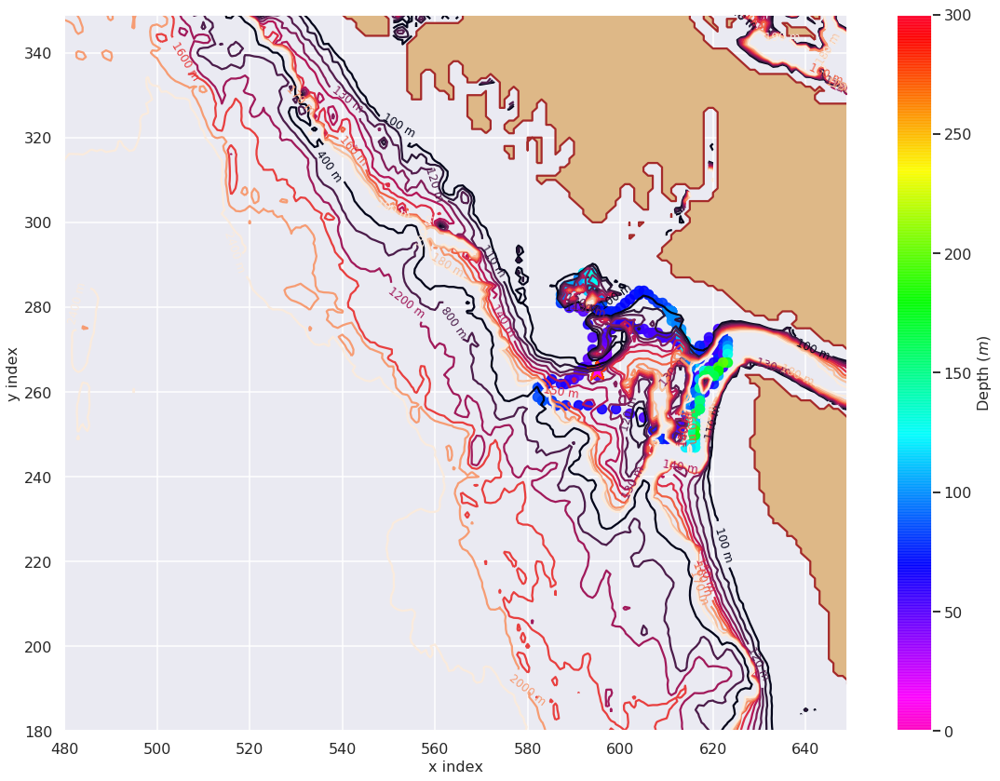

In [98]:
plot_particle_track(particle_ind=ind_local[20])

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


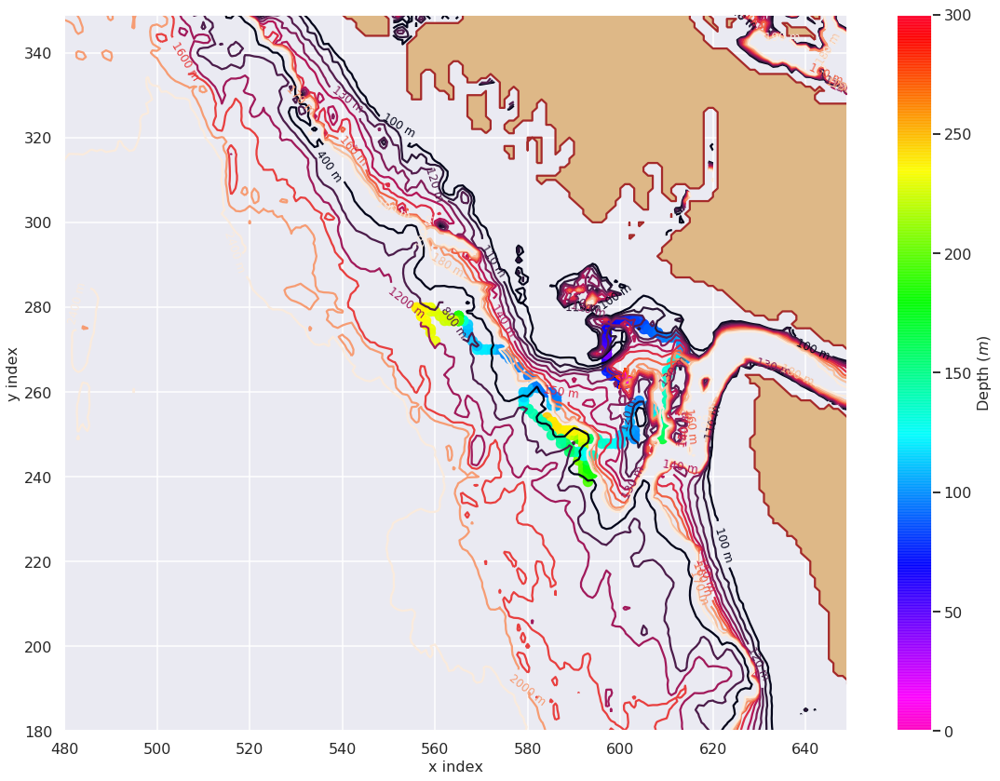

In [99]:
plot_particle_track(particle_ind=ind_local[50])

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


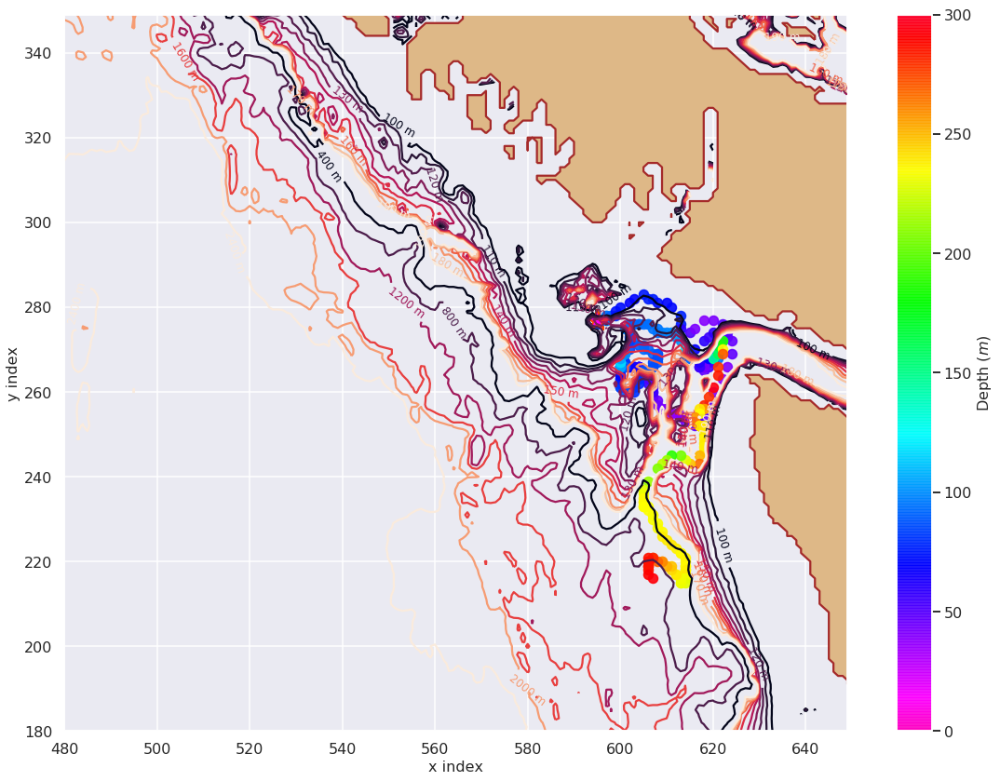

In [100]:
plot_particle_track(particle_ind=ind_local[150])

In [27]:
b.shape

(3, 1180)

In [23]:
T.shape

(1180,)

### For a 2 sigma (95 % confidence level)

(5, 12)

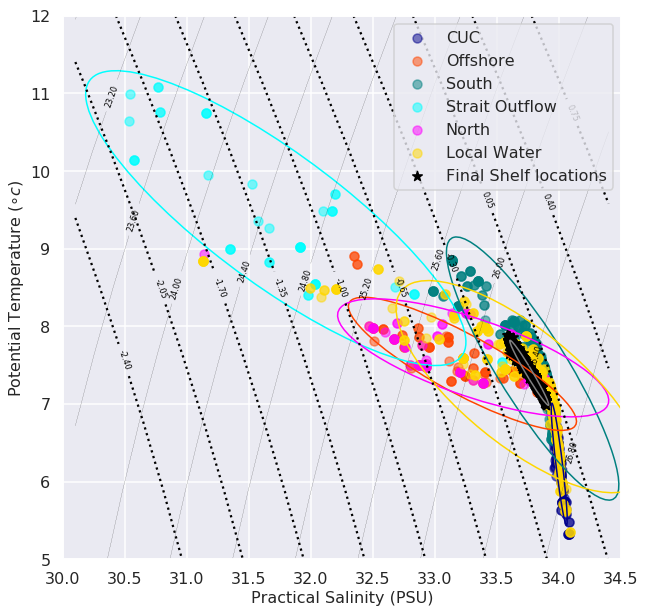

In [96]:
# colors = cmo.cm.phase(np.linspace(0, 1, 200))


# traj_sal_domain = traj_sal[traj_sal != 1.0100000202412861e+20]
# traj_tem_domain = traj_tem[traj_sal != 1.0100000202412861e+20]

# smin = np.nanmin(traj_sal_last)  - (0.01 * np.nanmin(traj_sal_last))
smin = 30
smax = np.nanmax(traj_sal_last)  + (0.01 * np.nanmax(traj_sal_last))
# tmin = np.nanmin(traj_tem_last) - (0.1 * np.nanmax(traj_tem_last))
tmin = 4
tmax = 12
# tmax = np.nanmax(traj_tem_last) + (0.1 * np.nanmax(traj_tem_last))
 
# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens_1 = np.empty((ydim,xdim))
spic_1 = np.empty((ydim,xdim))
SA = np.empty((xdim))
CT = np.empty((ydim)) 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        
        SA[i] = gsw.SA_from_SP(si[i], 0, np.mean(traj_lon), np.mean(traj_lat))

        CT[j] = gsw.CT_from_pt(si[i], ti[j])
        
        dens_1[j,i]=gsw.rho(SA[i],CT[j],0)
        
        spic_1[j,i] = gsw.spiciness0(SA[i],CT[j])
 
# Substract 1000 to convert to sigma-t
dens_1 = dens_1 - 1000;
 
# Plot data ***********************************************
fig1, ax = plt.subplots(1, 1, figsize=(10,10))
CS = ax.contour(si,ti,dens_1, np.arange(22.4,27,0.4), linestyles='dashed', linewidths = 0.2,colors='k')
CS1 = ax.contour(si,ti,spic_1,np.arange(-2.4,1,0.35), linestyles='dotted', colors='k')
plt.clabel(CS, fontsize=8, inline=1, fmt='%0.2f') # Label every second level
plt.clabel(CS1, fontsize=8, inline=1, fmt='%0.2f') # Label every second level



ax.scatter(traj_sal_final_cuc, traj_tem_final_cuc, s=80, alpha=0.5, c = 'darkblue', label = 'CUC')
sal_mean_cuc = np.mean(traj_sal_final_cuc)
tem_mean_cuc = np.mean(traj_tem_final_cuc)
cov_cuc = np.cov(traj_sal_final_cuc, traj_tem_final_cuc)
cuc_ell = get_cov_ellipse(cov_cuc, (sal_mean_cuc, tem_mean_cuc), 2,
                    ec='darkblue', fc = None)
cuc_ell.set_facecolor('none')
ax.add_artist(cuc_ell)




ax.scatter(traj_sal_final_off, traj_tem_final_off, s=80, alpha=0.5, c = 'orangered', label = 'Offshore')
sal_mean_off = np.mean(traj_sal_final_off)
tem_mean_off = np.mean(traj_tem_final_off)
cov_off = np.cov(traj_sal_final_off, traj_tem_final_off)
off_ell = get_cov_ellipse(cov_off, (sal_mean_off, tem_mean_off), 2,
                    ec='orangered', fc = None)
off_ell.set_facecolor('none')
ax.add_artist(off_ell)


traj_tem_final_north = traj_tem_final_north[traj_sal_final_north > 30]
traj_sal_final_north = traj_sal_final_north[traj_sal_final_north > 30]

ax.scatter(traj_sal_final_south, traj_tem_final_south, s=80, alpha=0.5, c= 'Teal', label = 'South')
sal_mean_south = np.mean(traj_sal_final_south)
tem_mean_south = np.mean(traj_tem_final_south)
cov_south = np.cov(traj_sal_final_south, traj_tem_final_south)
south_ell = get_cov_ellipse(cov_south, (sal_mean_south, tem_mean_south), 3,
                    ec='Teal', fc = None)
south_ell.set_facecolor('none')
ax.add_artist(south_ell)




# traj_tem_final_juan = traj_tem_final_juan[traj_sal_final_juan < 32.8]
# traj_sal_final_juan = traj_sal_final_juan[traj_sal_final_juan < 32.8]

ax.scatter(traj_sal_final_juan, traj_tem_final_juan, s=80, alpha=0.5, c = 'cyan', label = 'Strait Outflow')
sal_mean_juan = np.mean(traj_sal_final_juan)
tem_mean_juan = np.mean(traj_tem_final_juan)
cov_juan = np.cov(traj_sal_final_juan, traj_tem_final_juan)
juan_ell = get_cov_ellipse(cov_juan, (sal_mean_juan, tem_mean_juan), 2,
                    fc = None, ec='cyan')
juan_ell.set_facecolor('none')
ax.add_artist(juan_ell)




ax.scatter(traj_sal_final_north, traj_tem_final_north, s=80, alpha=0.5, c = 'Magenta', label = 'North')
sal_mean_north = np.mean(traj_sal_final_north)
tem_mean_north = np.mean(traj_tem_final_north)
cov_north = np.cov(traj_sal_final_north, traj_tem_final_north)
north_ell = get_cov_ellipse(cov_north, (sal_mean_north, tem_mean_north), 2,
                    ec='Magenta', fc = None)
north_ell.set_facecolor('none')
ax.add_artist(north_ell)

traj_tem_final_local = traj_tem_final_local[traj_sal_final_local > 30]
traj_sal_final_local = traj_sal_final_local[traj_sal_final_local > 30]

ax.scatter(traj_sal_final_local, traj_tem_final_local, s=80, alpha=0.5, c = 'Gold', label = 'Local Water')
sal_mean_local = np.mean(traj_sal_final_local)
tem_mean_local = np.mean(traj_tem_final_local)
cov_local = np.cov(traj_sal_final_local, traj_tem_final_local)
local_ell = get_cov_ellipse(cov_local, (sal_mean_local, tem_mean_local), 2,
                    ec='Gold', fc = None)
local_ell.set_facecolor('none')
ax.add_artist(local_ell)


traj_tem_init = traj_tem_init[traj_sal_init > 30]
traj_sal_init = traj_sal_init[traj_sal_init > 30]

ax.scatter(traj_sal_init, traj_tem_init, s=100, marker='*', c = 'k', label = "Final Shelf locations")#'chartreuse')
sal_mean_init = np.mean(traj_sal_init)
tem_mean_init = np.mean(traj_tem_init)
cov_init = np.cov(traj_sal_init, traj_tem_init)
init_ell = get_cov_ellipse(cov_init, (sal_mean_init, tem_mean_init), 2,
                    ec='gray', fc = None)
init_ell.set_facecolor('none')
ax.add_artist(init_ell)


ax.legend(loc = 'best', fontsize = 16)


 
ax.set_xlabel('Practical Salinity (PSU)', fontsize = 16)
ax.set_ylabel('Potential Temperature ($\circ c$)', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)
ax.set_xlim(30,34.5)
ax.set_ylim(5,12)


# legend = ax.legend(loc='upper right', fancybox=True, framealpha=0.25)

(5, 12)

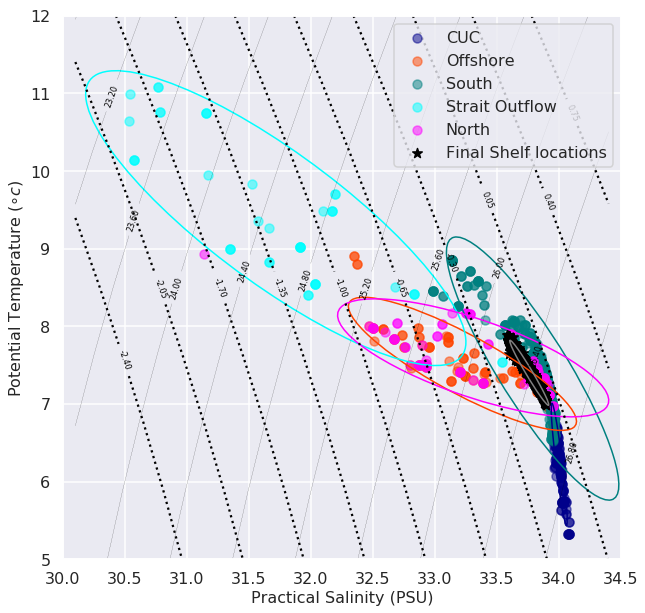

In [97]:
# colors = cmo.cm.phase(np.linspace(0, 1, 200))


# traj_sal_domain = traj_sal[traj_sal != 1.0100000202412861e+20]
# traj_tem_domain = traj_tem[traj_sal != 1.0100000202412861e+20]

# smin = np.nanmin(traj_sal_last)  - (0.01 * np.nanmin(traj_sal_last))
smin = 30
smax = np.nanmax(traj_sal_last)  + (0.01 * np.nanmax(traj_sal_last))
# tmin = np.nanmin(traj_tem_last) - (0.1 * np.nanmax(traj_tem_last))
tmin = 4
tmax = 12
# tmax = np.nanmax(traj_tem_last) + (0.1 * np.nanmax(traj_tem_last))
 
# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens_1 = np.empty((ydim,xdim))
spic_1 = np.empty((ydim,xdim))
SA = np.empty((xdim))
CT = np.empty((ydim)) 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        
        SA[i] = gsw.SA_from_SP(si[i], 0, np.mean(traj_lon), np.mean(traj_lat))

        CT[j] = gsw.CT_from_pt(si[i], ti[j])
        
        dens_1[j,i]=gsw.rho(SA[i],CT[j],0)
        
        spic_1[j,i] = gsw.spiciness0(SA[i],CT[j])
 
# Substract 1000 to convert to sigma-t
dens_1 = dens_1 - 1000;
 
# Plot data ***********************************************
fig1, ax = plt.subplots(1, 1, figsize=(10,10))
CS = ax.contour(si,ti,dens_1, np.arange(22.4,27,0.4), linestyles='dashed', linewidths = 0.2,colors='k')
CS1 = ax.contour(si,ti,spic_1,np.arange(-2.4,1,0.35), linestyles='dotted', colors='k')
plt.clabel(CS, fontsize=8, inline=1, fmt='%0.2f') # Label every second level
plt.clabel(CS1, fontsize=8, inline=1, fmt='%0.2f') # Label every second level



ax.scatter(traj_sal_final_cuc, traj_tem_final_cuc, s=80, alpha=0.5, c = 'darkblue', label = 'CUC')
sal_mean_cuc = np.mean(traj_sal_final_cuc)
tem_mean_cuc = np.mean(traj_tem_final_cuc)
cov_cuc = np.cov(traj_sal_final_cuc, traj_tem_final_cuc)
cuc_ell = get_cov_ellipse(cov_cuc, (sal_mean_cuc, tem_mean_cuc), 2,
                    ec='darkblue', fc = None)
cuc_ell.set_facecolor('none')
ax.add_artist(cuc_ell)




ax.scatter(traj_sal_final_off, traj_tem_final_off, s=80, alpha=0.5, c = 'orangered', label = 'Offshore')
sal_mean_off = np.mean(traj_sal_final_off)
tem_mean_off = np.mean(traj_tem_final_off)
cov_off = np.cov(traj_sal_final_off, traj_tem_final_off)
off_ell = get_cov_ellipse(cov_off, (sal_mean_off, tem_mean_off), 2,
                    ec='orangered', fc = None)
off_ell.set_facecolor('none')
ax.add_artist(off_ell)


traj_tem_final_north = traj_tem_final_north[traj_sal_final_north > 30]
traj_sal_final_north = traj_sal_final_north[traj_sal_final_north > 30]

ax.scatter(traj_sal_final_south, traj_tem_final_south, s=80, alpha=0.5, c= 'Teal', label = 'South')
sal_mean_south = np.mean(traj_sal_final_south)
tem_mean_south = np.mean(traj_tem_final_south)
cov_south = np.cov(traj_sal_final_south, traj_tem_final_south)
south_ell = get_cov_ellipse(cov_south, (sal_mean_south, tem_mean_south), 3,
                    ec='Teal', fc = None)
south_ell.set_facecolor('none')
ax.add_artist(south_ell)




# traj_tem_final_juan = traj_tem_final_juan[traj_sal_final_juan < 32.8]
# traj_sal_final_juan = traj_sal_final_juan[traj_sal_final_juan < 32.8]

ax.scatter(traj_sal_final_juan, traj_tem_final_juan, s=80, alpha=0.5, c = 'cyan', label = 'Strait Outflow')
sal_mean_juan = np.mean(traj_sal_final_juan)
tem_mean_juan = np.mean(traj_tem_final_juan)
cov_juan = np.cov(traj_sal_final_juan, traj_tem_final_juan)
juan_ell = get_cov_ellipse(cov_juan, (sal_mean_juan, tem_mean_juan), 2,
                    fc = None, ec='cyan')
juan_ell.set_facecolor('none')
ax.add_artist(juan_ell)




ax.scatter(traj_sal_final_north, traj_tem_final_north, s=80, alpha=0.5, c = 'Magenta', label = 'North')
sal_mean_north = np.mean(traj_sal_final_north)
tem_mean_north = np.mean(traj_tem_final_north)
cov_north = np.cov(traj_sal_final_north, traj_tem_final_north)
north_ell = get_cov_ellipse(cov_north, (sal_mean_north, tem_mean_north), 2,
                    ec='Magenta', fc = None)
north_ell.set_facecolor('none')
ax.add_artist(north_ell)


traj_tem_init = traj_tem_init[traj_sal_init > 30]
traj_sal_init = traj_sal_init[traj_sal_init > 30]

ax.scatter(traj_sal_init, traj_tem_init, s=100, marker='*', c = 'k', label = "Final Shelf locations")#'chartreuse')
sal_mean_init = np.mean(traj_sal_init)
tem_mean_init = np.mean(traj_tem_init)
cov_init = np.cov(traj_sal_init, traj_tem_init)
init_ell = get_cov_ellipse(cov_init, (sal_mean_init, tem_mean_init), 2,
                    ec='gray', fc = None)
init_ell.set_facecolor('none')
ax.add_artist(init_ell)


ax.legend(loc = 'best', fontsize = 16)


 
ax.set_xlabel('Practical Salinity (PSU)', fontsize = 16)
ax.set_ylabel('Potential Temperature ($\circ c$)', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)
ax.set_xlim(30,34.5)
ax.set_ylim(5,12)


# legend = ax.legend(loc='upper right', fancybox=True, framealpha=0.25)

(5, 12)

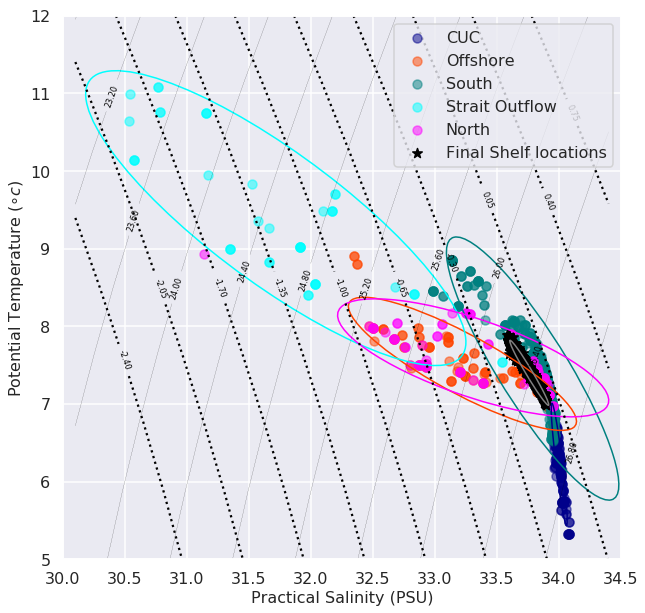

In [26]:
### With Corrections

# colors = cmo.cm.phase(np.linspace(0, 1, 200))


# traj_sal_domain = traj_sal[traj_sal != 1.0100000202412861e+20]
# traj_tem_domain = traj_tem[traj_sal != 1.0100000202412861e+20]

# smin = np.nanmin(traj_sal_last)  - (0.01 * np.nanmin(traj_sal_last))
smin = 30
smax = np.nanmax(traj_sal_last)  + (0.01 * np.nanmax(traj_sal_last))
# tmin = np.nanmin(traj_tem_last) - (0.1 * np.nanmax(traj_tem_last))
tmin = 4
tmax = 12
# tmax = np.nanmax(traj_tem_last) + (0.1 * np.nanmax(traj_tem_last))
 
# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens_1 = np.empty((ydim,xdim))
spic_1 = np.empty((ydim,xdim))
SA = np.empty((xdim))
CT = np.empty((ydim)) 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        
        SA[i] = gsw.SA_from_SP(si[i], 0, np.mean(traj_lon), np.mean(traj_lat))

        CT[j] = gsw.CT_from_pt(si[i], ti[j])
        
        dens_1[j,i]=gsw.rho(SA[i],CT[j],0)
        
        spic_1[j,i] = gsw.spiciness0(SA[i],CT[j])
 
# Substract 1000 to convert to sigma-t
dens_1 = dens_1 - 1000;
 
# Plot data ***********************************************
fig1, ax = plt.subplots(1, 1, figsize=(10,10))
CS = ax.contour(si,ti,dens_1, np.arange(22.4,27,0.4), linestyles='dashed', linewidths = 0.2,colors='k')
CS1 = ax.contour(si,ti,spic_1,np.arange(-2.4,1,0.35), linestyles='dotted', colors='k')
plt.clabel(CS, fontsize=8, inline=1, fmt='%0.2f') # Label every second level
plt.clabel(CS1, fontsize=8, inline=1, fmt='%0.2f') # Label every second level



ax.scatter(traj_sal_final_cuc, traj_tem_final_cuc, s=80, alpha=0.5, c = 'darkblue', label = 'CUC')
sal_mean_cuc = np.mean(traj_sal_final_cuc)
tem_mean_cuc = np.mean(traj_tem_final_cuc)
cov_cuc = np.cov(traj_sal_final_cuc, traj_tem_final_cuc)
cuc_ell = get_cov_ellipse(cov_cuc, (sal_mean_cuc, tem_mean_cuc), 2,
                    ec='darkblue', fc = None)
cuc_ell.set_facecolor('none')
ax.add_artist(cuc_ell)




ax.scatter(traj_sal_final_off, traj_tem_final_off, s=80, alpha=0.5, c = 'orangered', label = 'Offshore')
sal_mean_off = np.mean(traj_sal_final_off)
tem_mean_off = np.mean(traj_tem_final_off)
cov_off = np.cov(traj_sal_final_off, traj_tem_final_off)
off_ell = get_cov_ellipse(cov_off, (sal_mean_off, tem_mean_off), 2,
                    ec='orangered', fc = None)
off_ell.set_facecolor('none')
ax.add_artist(off_ell)


traj_tem_final_north = traj_tem_final_north[traj_sal_final_north > 30]
traj_sal_final_north = traj_sal_final_north[traj_sal_final_north > 30]

ax.scatter(traj_sal_final_south, traj_tem_final_south, s=80, alpha=0.5, c= 'Teal', label = 'South')
sal_mean_south = np.mean(traj_sal_final_south)
tem_mean_south = np.mean(traj_tem_final_south)
cov_south = np.cov(traj_sal_final_south, traj_tem_final_south)
south_ell = get_cov_ellipse(cov_south, (sal_mean_south, tem_mean_south), 3,
                    ec='Teal', fc = None)
south_ell.set_facecolor('none')
ax.add_artist(south_ell)




# traj_tem_final_juan = traj_tem_final_juan[traj_sal_final_juan < 32.8]
# traj_sal_final_juan = traj_sal_final_juan[traj_sal_final_juan < 32.8]

ax.scatter(traj_sal_final_juan, traj_tem_final_juan, s=80, alpha=0.5, c = 'cyan', label = 'Strait Outflow')
sal_mean_juan = np.mean(traj_sal_final_juan)
tem_mean_juan = np.mean(traj_tem_final_juan)
cov_juan = np.cov(traj_sal_final_juan, traj_tem_final_juan)
juan_ell = get_cov_ellipse(cov_juan, (sal_mean_juan, tem_mean_juan), 2,
                    fc = None, ec='cyan')
juan_ell.set_facecolor('none')
ax.add_artist(juan_ell)




ax.scatter(traj_sal_final_north, traj_tem_final_north, s=80, alpha=0.5, c = 'Magenta', label = 'North')
sal_mean_north = np.mean(traj_sal_final_north)
tem_mean_north = np.mean(traj_tem_final_north)
cov_north = np.cov(traj_sal_final_north, traj_tem_final_north)
north_ell = get_cov_ellipse(cov_north, (sal_mean_north, tem_mean_north), 2,
                    ec='Magenta', fc = None)
north_ell.set_facecolor('none')
ax.add_artist(north_ell)


traj_tem_init = traj_tem_init[traj_sal_init > 30]
traj_sal_init = traj_sal_init[traj_sal_init > 30]

ax.scatter(traj_sal_init, traj_tem_init, s=100, marker='*', c = 'k', label = "Final Shelf locations")#'chartreuse')
sal_mean_init = np.mean(traj_sal_init)
tem_mean_init = np.mean(traj_tem_init)
cov_init = np.cov(traj_sal_init, traj_tem_init)
init_ell = get_cov_ellipse(cov_init, (sal_mean_init, tem_mean_init), 2,
                    ec='gray', fc = None)
init_ell.set_facecolor('none')
ax.add_artist(init_ell)


ax.legend(loc = 'best', fontsize = 16)


 
ax.set_xlabel('Practical Salinity (PSU)', fontsize = 16)
ax.set_ylabel('Potential Temperature ($\circ c$)', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)
ax.set_xlim(30,34.5)
ax.set_ylim(5,12)


# legend = ax.legend(loc='upper right', fancybox=True, framealpha=0.25)

In [204]:
T_cuc   = np.mean(traj_tem_final_cuc)
T_south = np.mean(traj_tem_final_south)
T_off   = np.mean(traj_tem_final_off)
T_north = np.mean(traj_tem_final_north)
T_juan  = np.mean(traj_tem_final_juan)

S_cuc   = np.mean(traj_sal_final_cuc)
S_south = np.mean(traj_sal_final_south)
S_off   = np.mean(traj_sal_final_off)
S_north = np.mean(traj_sal_final_north)
S_juan  = np.mean(traj_sal_final_juan)

SPIC_cuc   = np.mean(spic_loc_cuc)
SPIC_south = np.mean(spic_loc_south)
SPIC_off   = np.mean(spic_loc_off)
SPIC_north = np.mean(spic_loc_north)
SPIC_juan  = np.mean(spic_loc_juan)

DEN_cuc   = np.mean(traj_rho_final_cuc)
DEN_south = np.mean(traj_rho_final_south)
DEN_off   = np.mean(traj_rho_final_off)
DEN_north = np.mean(traj_rho_final_north)
DEN_juan  = np.mean(traj_rho_final_juan)


# T    = np.mean(traj_tem_init)
# S    = np.mean(traj_sal_init)
# SPIC = np.mean(spic_loc_init)
# DEN  = np.mean(traj_rho_init)

# T    = traj_tem_init
# S    = traj_sal_init
# SPIC = spic_loc_init
# DEN  = traj_rho_init

NEP = nc.Dataset('/data/ssahu/NEP36_Extracted_Months/NEP36_2013_T_S_Spice_larger_offshore_rho_correct.nc')


sal = NEP.variables['vosaline']
temp = NEP.variables['votemper']
spic = NEP.variables['spiciness']
rho = NEP.variables['density']

sal_mean_august  = np.mean(sal[88:119,...], axis=0)
temp_mean_august = np.mean(sal[88:119,...], axis=0)
spic_mean_august = np.mean(spic[88:119,...], axis=0)
rho_mean_august  = np.mean(rho[88:119,...], axis=0)

S = sal_mean_august[:24,95,100:]
S = ma.masked_equal(S,  0)
T = temp_mean_august[:24,95,100:]
T = ma.masked_equal(T,  0)
SPIC = spic_mean_august[:24,95,100:]
SPIC = ma.masked_equal(SPIC,  -2.43206959e+01)
DEN  = rho_mean_august[:24,95,100:] -1000
DEN = ma.masked_equal(DEN,  -0.15576172)


temp_array = np.array([T_cuc, T_south, T_off, T_north, T_juan])
sal_array  = np.array([S_cuc, S_south, S_off, S_north, S_juan])
spic_array = np.array([SPIC_cuc, SPIC_south, SPIC_off, SPIC_north, SPIC_juan])
den_array = np.array([DEN_cuc, DEN_south, DEN_off, DEN_north, DEN_juan])

inds =  np.array([temp_array, sal_array, spic_array, den_array])

a = np.r_[inds, np.ones((1, 5))]
b = np.c_[T.ravel(), S.ravel(), SPIC.ravel(), DEN.ravel(), np.ones(T.shape).ravel()].T
m = np.linalg.solve(a, b)
m1 = m[0].reshape(T.shape)
m2 = m[1].reshape(T.shape)
m3 = m[2].reshape(T.shape)
m4 = m[3].reshape(T.shape)
m5 = m[4].reshape(T.shape)

m1 = ma.masked_outside(ma.masked_invalid(m1), 0, 1)
m2 = ma.masked_outside(ma.masked_invalid(m2), 0, 1)
m3 = ma.masked_outside(ma.masked_invalid(m3), 0, 1)
m4 = ma.masked_outside(ma.masked_invalid(m4), 0, 1)
m5 = ma.masked_outside(ma.masked_invalid(m5), 0, 1)

# m1 = 100 * m1
# m2 = 100 * m2
# m3 = 100 * m3

In [210]:
m

masked_array(data =
 [[ -1.35344180e+02  -1.36097885e+02  -1.36886426e+02 ...,   6.80929325e+01
    6.80929325e+01   6.80929325e+01]
 [ -3.52119977e+01  -3.56275878e+01  -3.58885254e+01 ...,  -4.19480344e+01
   -4.19480344e+01  -4.19480344e+01]
 [  2.53658390e+02   2.55368799e+02   2.56951565e+02 ...,  -6.66802630e+01
   -6.66802630e+01  -6.66802630e+01]
 [ -1.76445104e-01  -1.78443668e-01  -1.79834379e-01 ...,  -6.97456045e-02
   -6.97456045e-02  -6.97456045e-02]
 [ -8.19257670e+01  -8.24648828e+01  -8.29967793e+01 ...,   4.16051105e+01
    4.16051105e+01   4.16051105e+01]],
             mask =
 False,
       fill_value = 1e+20)

(30, 34.5)

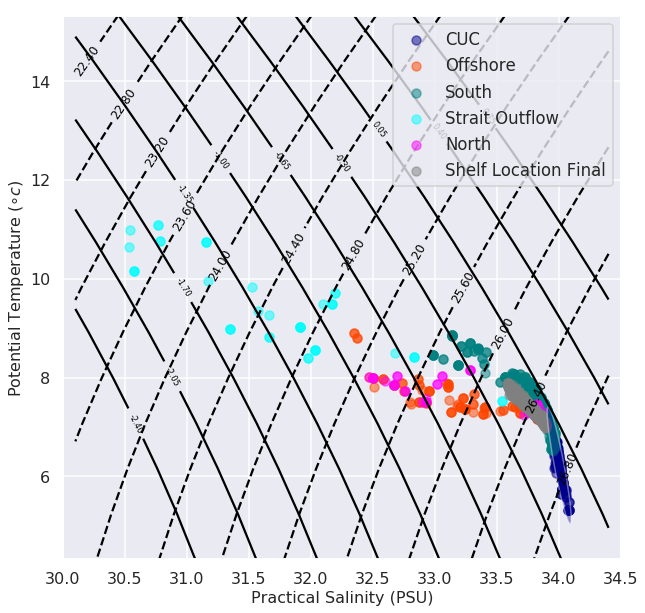

In [58]:
# colors = cmo.cm.phase(np.linspace(0, 1, 200))


# traj_sal_domain = traj_sal[traj_sal != 1.0100000202412861e+20]
# traj_tem_domain = traj_tem[traj_sal != 1.0100000202412861e+20]

# smin = np.nanmin(traj_sal_last)  - (0.01 * np.nanmin(traj_sal_last))
smin = 30
smax = np.nanmax(traj_sal_last)  + (0.01 * np.nanmax(traj_sal_last))
tmin = np.nanmin(traj_tem_last) - (0.1 * np.nanmax(traj_tem_last))
tmax = np.nanmax(traj_tem_last) + (0.1 * np.nanmax(traj_tem_last))
 
# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens_1 = np.empty((ydim,xdim))
spic_1 = np.empty((ydim,xdim))
SA = np.empty((xdim))
CT = np.empty((ydim)) 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        
        SA[i] = gsw.SA_from_SP(si[i], 0, np.mean(traj_lon), np.mean(traj_lat))

        CT[j] = gsw.CT_from_pt(si[i], ti[j])
        
        dens_1[j,i]=gsw.rho(SA[i],CT[j],0)
        
        spic_1[j,i] = gsw.spiciness0(SA[i],CT[j])
 
# Substract 1000 to convert to sigma-t
dens_1 = dens_1 - 1000;
 
# Plot data ***********************************************
fig1, ax = plt.subplots(1, 1, figsize=(10,10))
CS = ax.contour(si,ti,dens_1, np.arange(22.4,27,0.4), linestyles='dashed', colors='k')
CS1 = ax.contour(si,ti,spic_1,np.arange(-2.4,1,0.35), linestyles='solid', colors='k')
plt.clabel(CS, fontsize=12, inline=1, fmt='%0.2f') # Label every second level
plt.clabel(CS1, fontsize=8, inline=1, fmt='%0.2f') # Label every second level


# for traj_depth_level in np.arange(traj_depth.shape[1]):


ax.scatter(traj_sal_final_cuc, traj_tem_final_cuc, s=80, alpha=0.5, c = 'darkblue', label = 'CUC')
sal_mean_cuc = np.mean(traj_sal_final_cuc)
tem_mean_cuc = np.mean(traj_tem_final_cuc)
cov_cuc = np.cov(traj_sal_final_cuc, traj_tem_final_cuc)
# ax.scatter(traj_sal_final_cuc, sdata['mass'], color=colours[gender],
#            label=labels[gender], s=3)
cuc_ell = get_cov_ellipse(cov_cuc, (sal_mean_cuc, tem_mean_cuc), 3,
                    fc='darkblue', alpha=0.4)
ax.add_artist(cuc_ell)





ax.scatter(traj_sal_final_off, traj_tem_final_off, s=80, alpha=0.5, c = 'orangered', label = 'Offshore')
ax.scatter(traj_sal_final_south, traj_tem_final_south, s=80, alpha=0.5, c= 'Teal', label = 'South')
ax.scatter(traj_sal_final_juan, traj_tem_final_juan, s=80, alpha=0.5, c = 'cyan', label = 'Strait Outflow')
ax.scatter(traj_sal_final_north, traj_tem_final_north, s=80, alpha=0.5, c = 'Magenta', label = 'North')
ax.scatter(traj_sal_init, traj_tem_init, s=80, alpha=0.5, c = 'gray', label = 'Shelf Location Final')
ax.legend(loc = 'best')


 
ax.set_xlabel('Practical Salinity (PSU)', fontsize = 16)
ax.set_ylabel('Potential Temperature ($\circ c$)', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)
ax.set_xlim(30,34.5)


# legend = ax.legend(loc='upper right', fancybox=True, framealpha=0.25)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


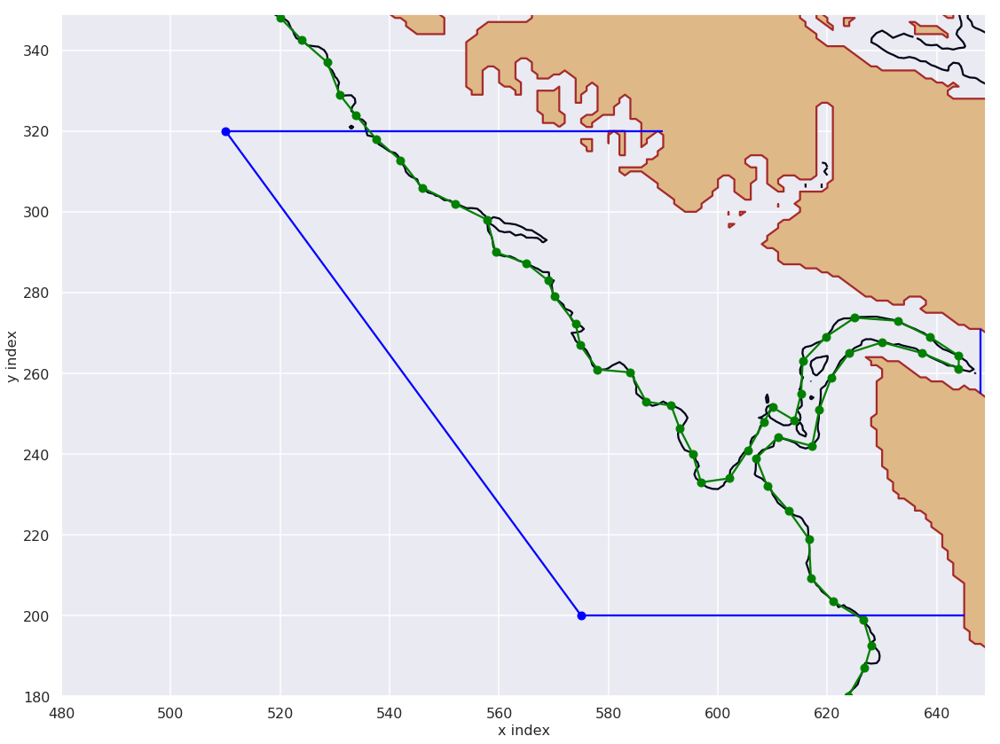

In [8]:



bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]




cmap=plt.cm.get_cmap('nipy_spectral')
#     cmap = plt.cm.get_cmap('gist_rainbow')
cmap.set_bad('#8b7765')
cmin = 0
cmax = 300

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
# CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
# CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
# CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)




ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

x = [510,575]
y = [320,200]
ax.plot(x, y , 'bo-')

xmin = x_wcvi_slice[np.int(np.min(np.unique(x1)))]-1
xmax = x_wcvi_slice[np.int(np.max(np.unique(x1)))]-1


ymin = y_wcvi_slice[np.int(np.min(np.unique(y1)))]-1
ymax  = y_wcvi_slice[np.int(np.max(np.unique(y1)))]-1


# x_1 = [xmin, xmax]
# y_1 = [ymin, ymin]
# ax.plot(x_1, y_1 , 'go-')

# x_2 = [xmin, xmax]
# y_2 = [ymax, ymax]
# ax.plot(x_2, y_2 , 'go-')

# x_3 = [xmin, xmin]
# y_3 = [ymin, ymax]
# ax.plot(x_3, y_3 , 'go-')

# x_4 = [xmax, xmax]
# y_4 = [ymin, ymax]
# ax.plot(x_4, y_4 , 'go-')

ax.vlines(x = 648, ymin = 255, ymax = 271, color = 'blue')

# ax.get_legend().remove()
# lon_LB08 = -125.4775
# lat_LB08 = 48.4217

# j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
#                                           lon,lat,grid='NEMO',tols=\
#                                           {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
#                                            'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

# ax.scatter(i,j, marker = 'o', c = 'red', s = 300, linewidths=100, label = 'Eddy region')

ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
ax.hlines(y = 320, xmin = 510, xmax=590, color = 'b')
ax.grid()

contour = CS.collections[0]
vs = contour.get_paths()[0].vertices


vert = CS.collections[0].get_paths()[0].vertices

x_200_wcvi = vert[:,0]
y_200_wcvi = vert[:,1]

# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

Line = ax.plot(x_200_wcvi[::10], y_200_wcvi[::10], 'go-')
fig.tight_layout()





In [19]:
IK = find_index(500)

PK = find_index(1000)

# LK = find_index(1500)

# JK = find_index(2000)

# LI = find_index(2500)

# LP = find_index(3000)

# MN = find_index(3500)

total_indi = np.concatenate((IK,PK))#,LK,JK,LI, LP, MN))

In [20]:
total_indi.shape

(1038,)

In [21]:
cross_index = []


for i in np.unique(total_indi):

    if ((np.max(-traj_depth[:,i]) >= 200) & (np.min(-traj_depth[:,i]) < 200)) == True:
        
        cross_index = np.append(arr=cross_index, values=i)
        


In [23]:
cross_index.shape

(355,)

In [25]:
percentage = cross_index.shape[0]/final_age_days.shape[0]

print(percentage)

0.3008474576271186


### 30 percent of the particles have been upwelled obeying both the definitions

In [26]:
time_index = np.empty_like(cross_index)

for k in np.arange(cross_index.shape[0]):
    time_index[k] = np.min(np.argwhere(-traj_depth[:,cross_index[k].astype(int)] > 200))
    
    

In [27]:
np.save(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/numpy_arrays_saved/cross_index_all_down.npy', arr=cross_index)

np.save(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/numpy_arrays_saved/time_index_all_down.npy', arr=time_index)


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


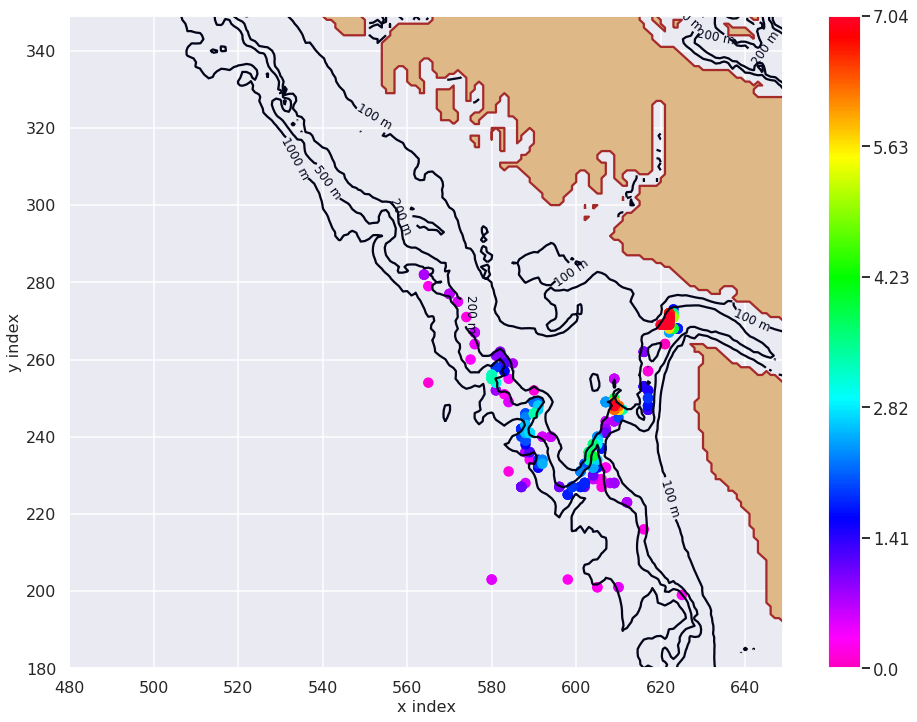

In [74]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





cmap = plt.get_cmap(cmo.cm.dense)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]




# cmap=plt.cm.get_cmap('nipy_spectral')
cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')
vmin = 0
vmax = 25

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
# CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
# CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
# CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
# CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

x = [520,575]
y = [320,200]
# ax.plot(x, y , 'bo-')



# for simplex in hull_barkley.simplices:
#     plt.plot(points[simplex, 0], points[simplex, 1])



# ax.plot(x_b, y_b , 'yo-')

xmin = x_wcvi_slice[np.int(np.min(np.unique(x1)))]-1
xmax = x_wcvi_slice[np.int(np.max(np.unique(x1)))]-1


ymin = y_wcvi_slice[np.int(np.min(np.unique(y1)))]-1
ymax  = y_wcvi_slice[np.int(np.max(np.unique(y1)))]-1


# x_1 = [xmin, xmax]
# y_1 = [ymin, ymin]
# ax.plot(x_1, y_1 , 'go-')

# x_2 = [xmin, xmax]
# y_2 = [ymax, ymax]
# ax.plot(x_2, y_2 , 'go-')

# x_3 = [xmin, xmin]
# y_3 = [ymin, ymax]
# ax.plot(x_3, y_3 , 'go-')

# x_4 = [xmax, xmax]
# y_4 = [ymin, ymax]
# ax.plot(x_4, y_4 , 'go-')

# ax.vlines(x = 635, ymin = 261, ymax = 279, color = 'blue')

# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

# ax.scatter(i,j, marker = 'o', c = 'red', s = 300, linewidths=100, label = 'Eddy region')

# x_up = []
# y_up = []

# for k in np.arange(cross_index.shape[0]):
#     y_p, x_p = geo_tools.find_closest_model_point(traj_lon[time_index[k].astype(int), cross_index[k].astype(int)],\
#                                           traj_lat[time_index[k].astype(int), cross_index[k].astype(int)],\
#                                           lon,lat,grid='NEMO',tols=\
#                                           {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
#                                            'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 
    
#     y_up = np.append(arr=y_up, values=y_p)
#     x_up = np.append(arr=x_up, values=x_p)
    

    
# ax.scatter(x_up,y_up, marker = '*', c = 'purple', s = 10, linewidths=2, label = 'Upwelled locations (200m crossings)')   

x_up = []
y_up = []

for k in np.arange(cross_index.shape[0]):
    y_p, x_p = geo_tools.find_closest_model_point(traj_lon[time_index[k].astype(int), cross_index[k].astype(int)],\
                                          traj_lat[time_index[k].astype(int), cross_index[k].astype(int)],\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 
    
    y_up = np.append(arr=y_up, values=y_p)
    x_up = np.append(arr=x_up, values=x_p)
    


q = density_scatter(x_up, y_up, ax= ax, bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)

q.autoscale(enable=True,axis='both')
# ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
# ax.hlines(y = 320, xmin = 520, xmax=590, color = 'b')
ax.grid()

# cbar = fig.colorbar(q, cax =ax)

# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

# Line = ax.plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')

# plt.colorbar(q)
# colorbar(q)

# import matplotlib.ticker as ticker

# def fmt(x, pos):
#     a = '{:.2f}'.format(x)
# #     b = int(b)
#     return r'${}$'.format(a)

m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)
cbar = fig.colorbar(m)#, format=ticker.FuncFormatter(fmt))


cbar.ax.set_yticklabels(np.around(a=np.linspace(start=(cbar.vmin/cross_index.shape[0])*100, \
                                    stop=(cbar.vmax/cross_index.shape[0])*100, num=6), decimals = 2))





In [64]:
x = cbar.vmax

print(x)

25.0


In [68]:
cross_index.shape[0]

355

In [67]:
time_index.shape

(355,)

In [39]:
m.get_clim()

(0, 25)

In [41]:
m.get_clim()[0]

0

In [50]:
m.get_clim()[1]

25

In [52]:
np.linspace(start=m.get_clim()[0], stop=m.get_clim()[-1], num=5)

array([ 0.        ,  0.01760563,  0.03521127,  0.0528169 ,  0.07042254])

In [44]:
np.arange(m.get_clim()[0],m.get_clim()[1])

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24])

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


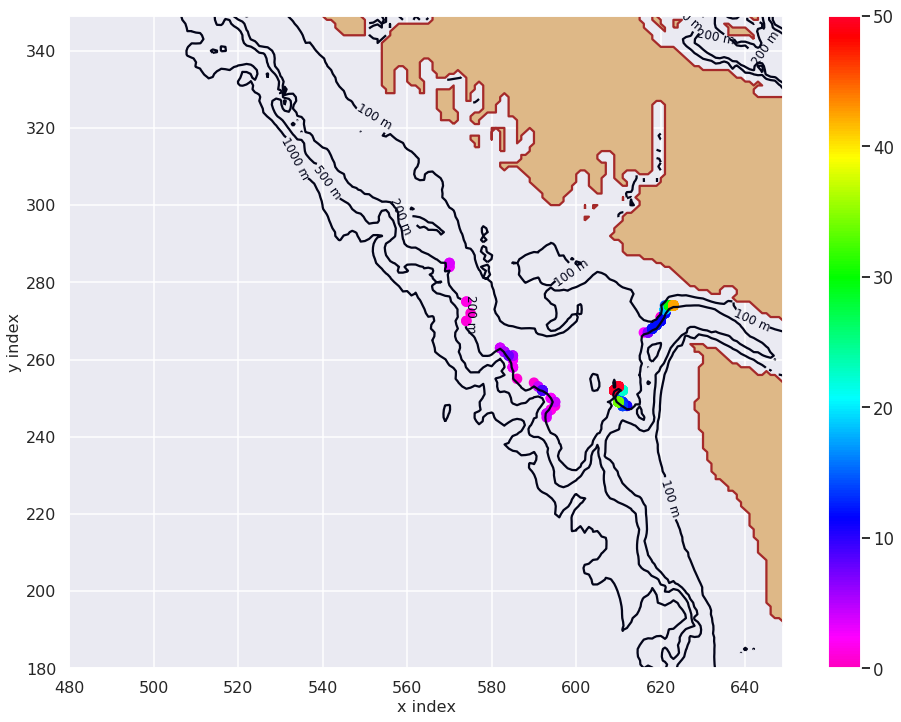

In [75]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





# cmap = plt.get_cmap(cmo.cm.turbid)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]

vmin = 0
vmax = 50


# cmap=plt.cm.get_cmap('nipy_spectral')
cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')


import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
# CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
# CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
# CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
# CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')


# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

q = density_scatter(x_200_total[~np.isnan(y_200_total)], y_200_total[~np.isnan(y_200_total)], ax= ax, bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)
# ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
# ax.hlines(y = 320, xmin = 520, xmax=590, color = 'b')
ax.grid()

# cbar = fig.colorbar(q, cax =ax)

# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

# Line = ax.plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')

# plt.colorbar(q)
# colorbar(q)

m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)
plt.colorbar(m)





In [73]:
cross_index = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/numpy_arrays_saved/cross_index_all_down.npy')

time_index  = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/numpy_arrays_saved/time_index_all_down.npy')

In [72]:
x_200_total = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/x_200_total_all_down.npy')

y_200_total  = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/y_200_total_all_down.npy')

# x_200_total = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/x_200_total_all_down_multiple.npy')

# y_200_total  = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/y_200_total_all_down_multiple.npy')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


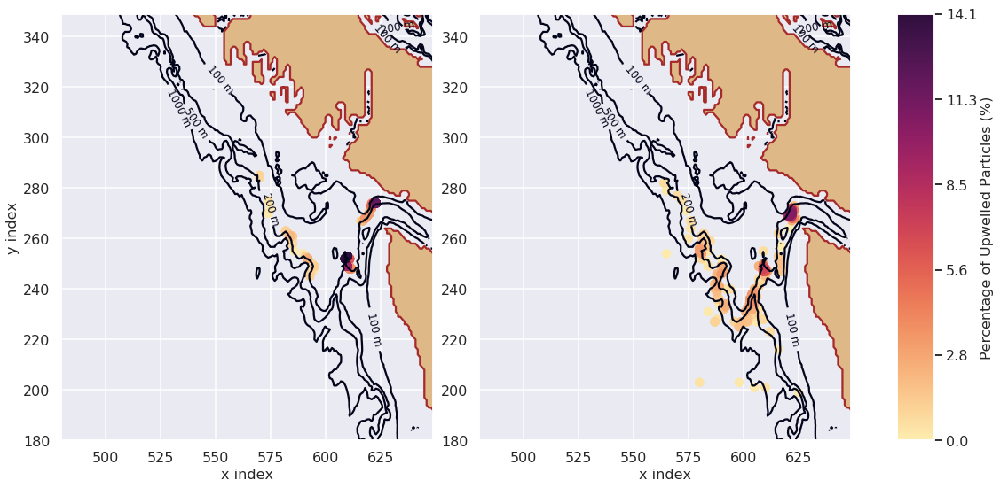

In [77]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





cmap = plt.get_cmap(cmo.cm.matter)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]




# cmap=plt.cm.get_cmap('nipy_spectral')
# cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')
vmin = 0
vmax = 50

import matplotlib as mpl

gridspec = {'width_ratios': [1, 1, 0.1]}

fig, ax = plt.subplots(1, 3, figsize=(16, 8), gridspec_kw=gridspec)


# fig, (ax1,ax) = plt.subplots(1, 2, figsize=(12,8), sharey=True); 

ax[0].grid()

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax[0].set_xlabel('x index', fontsize =16)
ax[0].set_ylabel('y index', fontsize = 16)
ax[0].tick_params(axis='both',labelsize =16)

ax[0].legend(loc = 'best')

viz_tools.plot_land_mask(ax[0], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax[0], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')


lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 


q = density_scatter(x_200_total[~np.isnan(y_200_total)], y_200_total[~np.isnan(y_200_total)], ax= ax[0], bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)

ax[0].grid()


# Line = ax[0].plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')



ax[1].grid()


CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)




ax[1].set_xlabel('x index', fontsize =16)
# ax.set_ylabel('y index', fontsize = 16)
ax[1].tick_params(axis='both',labelsize =16)



ax[1].legend(loc = 'best')

viz_tools.plot_land_mask(ax[1], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax[1], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')



# ax.vlines(x = 635, ymin = 261, ymax = 279, color = 'blue')

# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 


q = density_scatter(x_up, y_up, ax= ax[1], bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)

ax[1].grid()


# Line = ax[1].plot(x_200_wcvi[::1], y_200_wcvi[::1], 'm-')



m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)
# plt.colorbar(m, cax=ax[2])

cbar = fig.colorbar(m, cax=ax[2])#, format=ticker.FuncFormatter(fmt))


cbar.ax.set_yticklabels(np.around(a=np.linspace(start=(cbar.vmin/cross_index.shape[0])*100, \
                                    stop=(cbar.vmax/cross_index.shape[0])*100, num=6), decimals = 1))

cbar.set_label(label='Percentage of Upwelled Particles (%)', fontsize = 16)
cbar.ax.tick_params(labelsize=16)

fig.tight_layout(h_pad=0.01,w_pad=0.01)



### Taking into account the multiple crossings of the 200m isobath

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


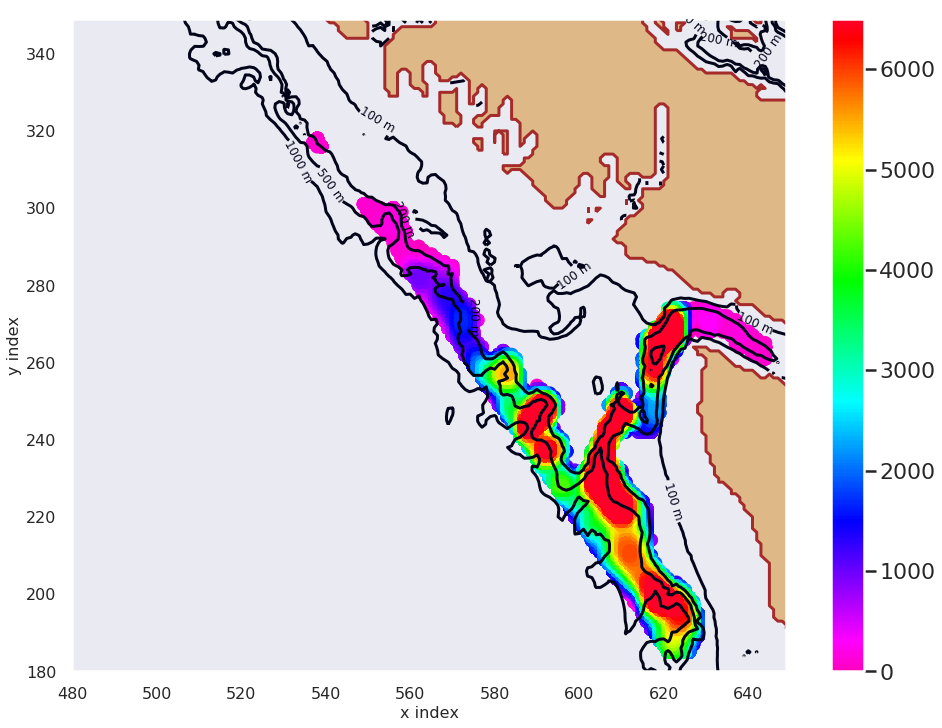

In [24]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





# cmap = plt.get_cmap(cmo.cm.turbid)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]

vmin = 0
vmax = 6500


# cmap=plt.cm.get_cmap('nipy_spectral_r')
cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')


import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
# CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
# CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
# CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
# CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')


# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

q = density_scatter(x_200_total[~np.isnan(y_200_total)], y_200_total[~np.isnan(y_200_total)], ax= ax, bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)
# ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
# ax.hlines(y = 320, xmin = 520, xmax=590, color = 'b')
ax.grid()

# cbar = fig.colorbar(q, cax =ax)

# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

# Line = ax.plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')

# plt.colorbar(q)
# colorbar(q)

m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)
plt.colorbar(m)





In [20]:
y_200_total.shape

(953201,)

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


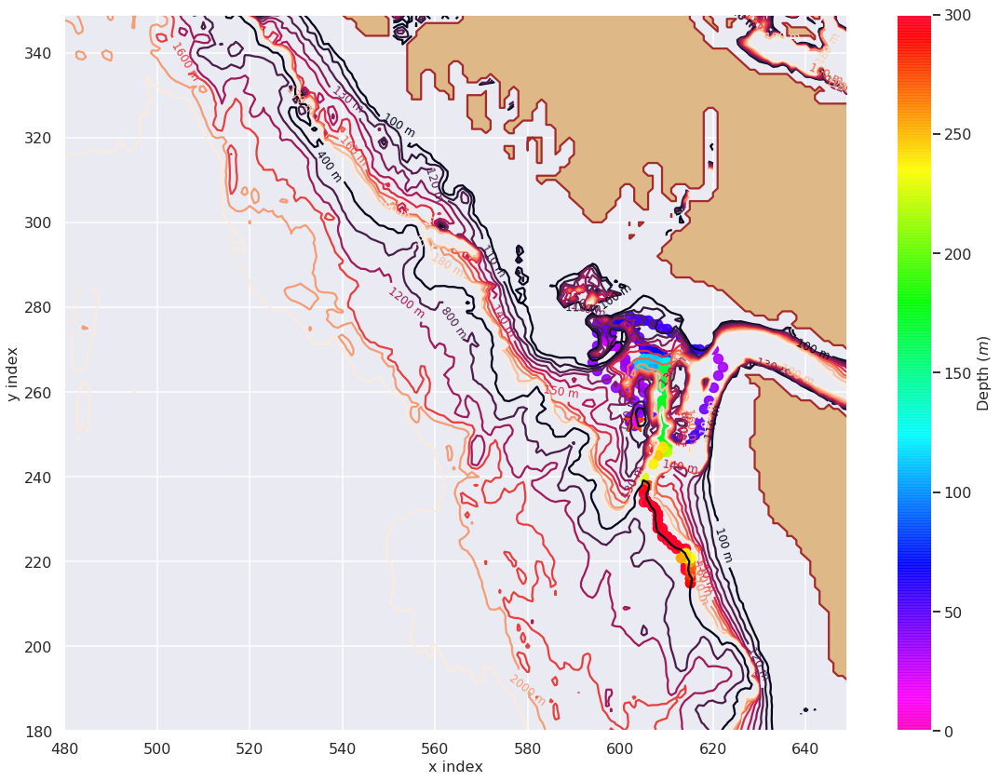

In [83]:
plot_particle_track(particle_ind=cross_index[45].astype(int))

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


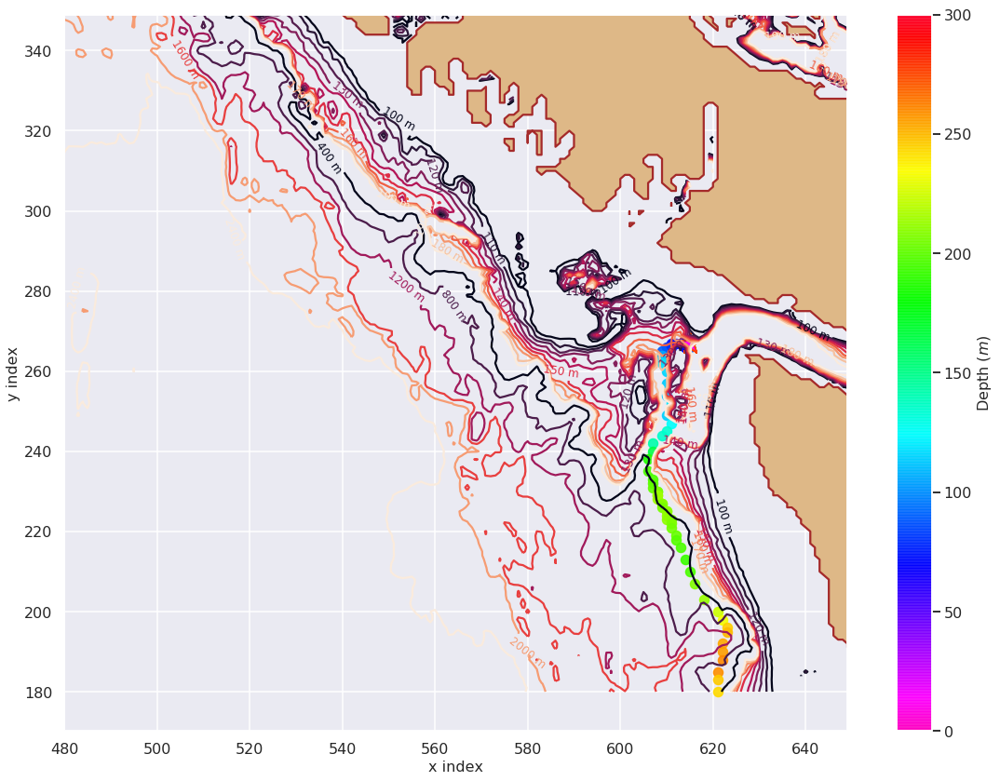

In [91]:
plot_particle_track(particle_ind=cross_index[150].astype(int))

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


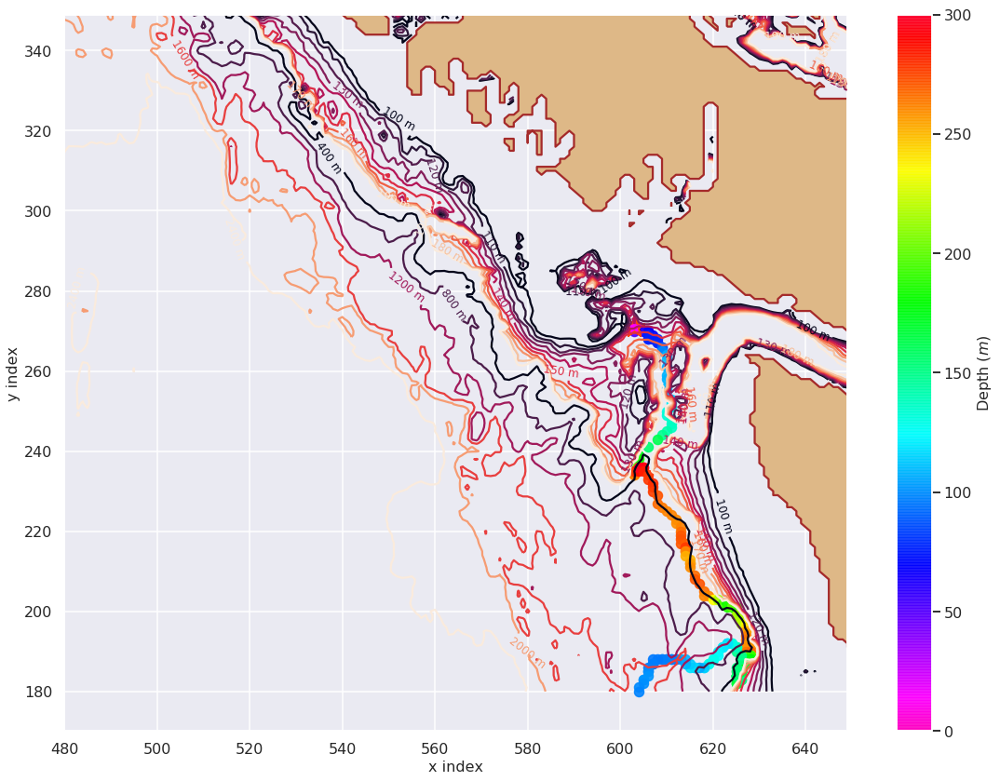

In [92]:
plot_particle_track(particle_ind=cross_index[250].astype(int))

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


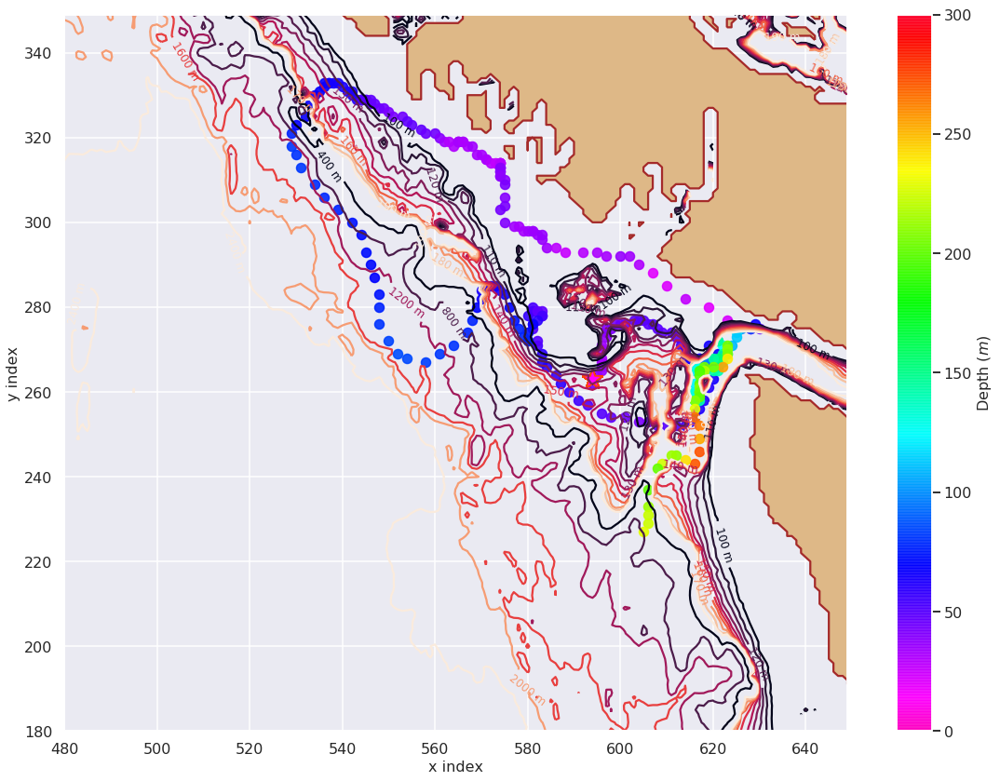

In [93]:
plot_particle_track(particle_ind=cross_index[0].astype(int))

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


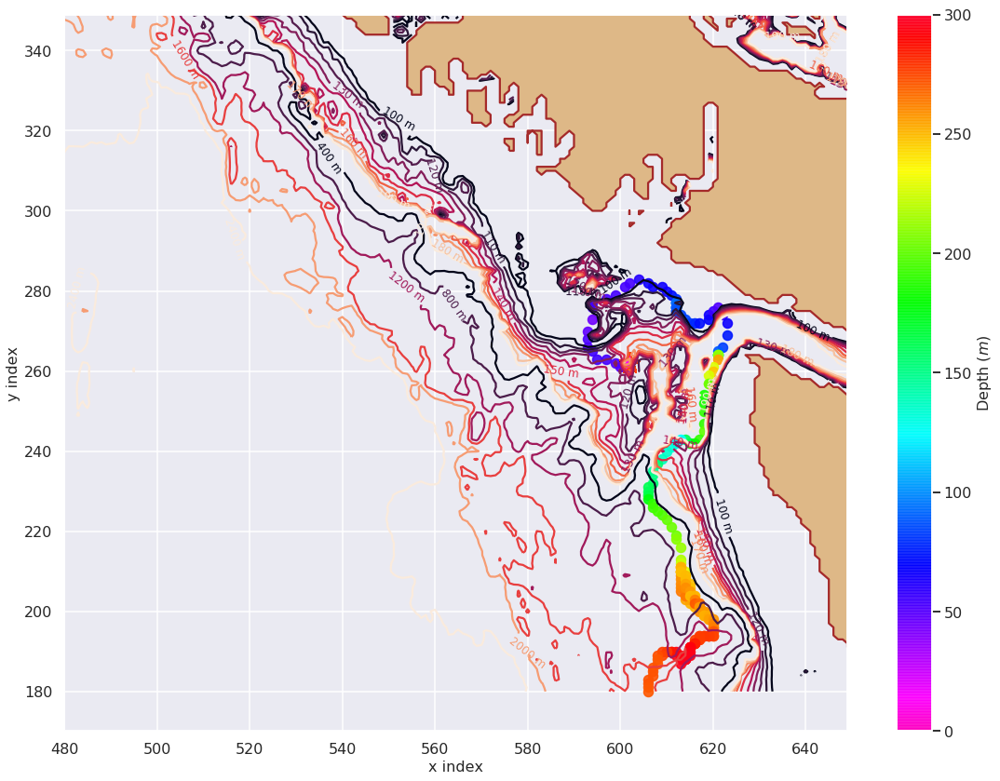

In [94]:
plot_particle_track(particle_ind=cross_index[30].astype(int))

### Now for the true positive particles which shows high spice both in model and observations

In [52]:
zlevels = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/CDF_COMB_COMPRESSED/NEP036-N30_IN_20140915_00001440_grid_T.nc').variables['deptht'][:32]
y_wcvi_slice = np.array(np.arange(180,350))
x_wcvi_slice = np.array(np.arange(480,650))


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]



nc_file = nc.Dataset('/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/isopyncal_263/right_traj_all_down_high_spice.nc')
nc_tools.show_variables(nc_file)

odict_keys(['init_x', 'init_y', 'init_z', 'init_t', 'init_age', 'init_transp', 'final_x', 'final_y', 'final_z', 'final_t', 'final_age', 'final_transp', 'traj_lon', 'traj_lat', 'traj_depth', 'traj_time', 'traj_temp', 'traj_salt', 'traj_dens'])


In [53]:


init_x = nc_file.variables['init_x']
init_z = nc_file.variables['init_z']
init_age = nc_file.variables['init_age']

traj_depth = nc_file.variables['traj_depth'][:]
traj_lon   = nc_file.variables['traj_lon'][:]
traj_lat   = nc_file.variables['traj_lat'][:]
traj_rho   = nc_file.variables['traj_dens'][:]
traj_tem   = nc_file.variables['traj_temp'][:]
traj_sal   = nc_file.variables['traj_salt'][:]
traj_time  = nc_file.variables['traj_time']


final_age = nc_file.variables['final_age']


# lon1=nc_file.variables['traj_lon'][:]
# lat1=nc_file.variables['traj_lat'][:]
# dep1=nc_file.variables['traj_depth'][:]
x1=nc_file.variables['init_x'][:]
y1=nc_file.variables['init_y'][:]
t1=nc_file.variables['traj_time'][:]

x_high = x1
y_high = y1

x2=nc_file.variables['final_x'][:]
y2=nc_file.variables['final_y'][:]


final_z = nc_file.variables['final_z'][:]

final_age_days = final_age[:]/(3600)

/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:10: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:11: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type
/home/ssahu/anaconda3/lib/python3.5/site-packages/ipykernel/__main__.py:12: UserWarning: WARNING: missing_value not used since it
cannot be safely cast to variable data type


In [54]:
x_final = []
y_final = []


for i in np.arange(x2.shape[0]):
    x_final = np.append(arr=x_final,values=x_wcvi_slice[np.int(np.rint(x2[i]))-1])
    y_final = np.append(arr=y_final,values=y_wcvi_slice[np.int(np.rint(y2[i]))-1])

In [55]:
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

p1= (x[0],y[0])
p1 = np.asarray(p1)
p2 = (x[1], y[1])
p2 = np.asarray(p2)



d = np.empty_like(x_final)

off_ind = []


for r in np.arange(x_final.shape[0]):

    p3 = (x_final[r], y_final[r])
    p3 = np.asarray(p3)
    d[r] =np.cross(p2-p1,p3-p1)/np.linalg.norm(p2-p1)
    
    if ((d[r] < 0) & (x_final[r] < 575)):
        off_ind = np.append(arr=off_ind, values=np.int(r))

In [56]:
num_north = np.round(a=final_age[(x_final < 580) & (y_final > 300)].shape[0]/final_z.shape[0], decimals=3)

north_percent = 100*num_north

print(north_percent)

num_cuc = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0].shape[0]/final_z.shape[0], decimals = 3)

cuc_percent = 100*num_cuc

print(cuc_percent)

num_south = np.round(a=np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0].shape[0]/final_z.shape[0], decimals = 3)

south_percent = 100*num_south

print(south_percent)

### Bigger box
x = [510,575]
y = [320,200]


coefficients = np.polyfit(x, y, 1)

x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

num_off = off_ind.shape[0]/final_z.shape[0]
off_percent = np.round(a=100*num_off, decimals=1)

print(off_percent)

num_juan = np.round(a=np.where((x_final > 648))[0].shape[0]/final_z.shape[0], decimals=3)

juan_percent = num_juan*100

print(juan_percent)

9.5
13.0
39.9
12.9
2.7


In [57]:
cuc_percent_high = cuc_percent
juan_percent_high = juan_percent
north_percent_high = north_percent
south_percent_high = south_percent
off_percent_high = off_percent



For particles(high Spice) rightly predicted by model on 26.3 isopycncal and below


/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "
/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/figure.py:1743: UserWarning: This figure includes Axes that are not compatible with tight_layout, so its results might be incorrect.
  warnings.warn("This figure includes Axes that are not "


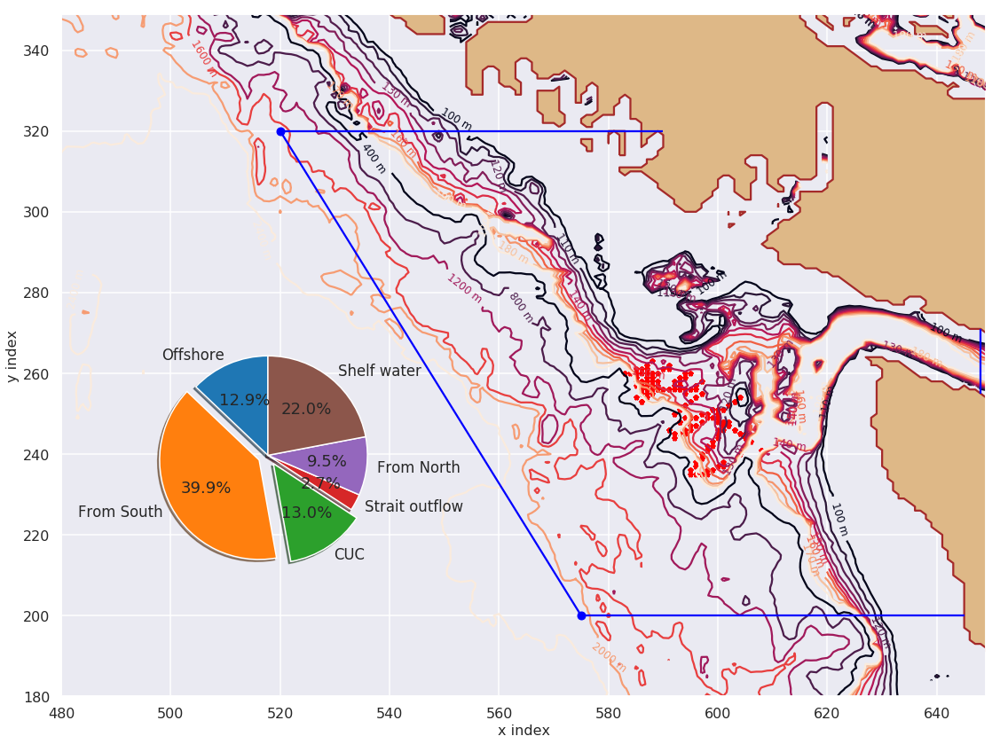

In [14]:
print("For particles(high Spice) rightly predicted by model on 26.3 isopycncal and below")


plot_pie_diagram(cuc_percentage=cuc_percent, juan_percentage=juan_percent, \
                 north_percentage=north_percent, south_percentage=south_percent, \
                 off_percentage=off_percent)

In [58]:
traj_tem_last   = np.empty_like(final_age_days)
traj_sal_last   = np.empty_like(final_age_days)
traj_rho_last   = np.empty_like(final_age_days)
traj_depth_last = np.empty_like(final_age_days)


traj_tem_init   = np.empty_like(final_age_days)
traj_sal_init   = np.empty_like(final_age_days)
traj_rho_init   = np.empty_like(final_age_days)
traj_depth_init = np.empty_like(final_age_days)

for r in np.arange(traj_tem_last.shape[0]):
    traj_tem_last[r]  =  traj_tem[np.int(final_age_days[r]),r]
    traj_sal_last[r]  =  traj_sal[np.int(final_age_days[r]),r]
    traj_rho_last[r]  =  traj_rho[np.int(final_age_days[r]),r]
    traj_depth_last[r] = traj_depth[np.int(final_age_days[r]),r]
    
    traj_tem_init[r]  =  traj_tem[0,r]
    traj_sal_init[r]  =  traj_sal[0,r]
    traj_rho_init[r]  =  traj_rho[0,r]    
    traj_depth_init[r]=  traj_depth[0,r] 
    

In [59]:
max_life_ind = np.array(np.where(final_age_days == np.max(final_age_days))[0])

off_ind   = off_ind
north_ind = np.where([(x_final < 580) & (y_final > 300)])[1]
south_ind = []
cuc_ind   = []


ind_all_south  = np.where(((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200)))[0]


for k in ind_all_south:
    if final_z[k] <= 28:
        south_ind = np.append(arr=south_ind, values= k)
        
    if final_z[k] > 28:
        cuc_ind = np.append(arr=cuc_ind, values=k)
        

juan_ind =  np.where((x_final > 648))[0]

non_local_ind = np.concatenate((off_ind, north_ind, south_ind, cuc_ind, juan_ind))

ind_local = np.setdiff1d(max_life_ind, np.unique(non_local_ind, return_index= False).astype(int), assume_unique=True)

# off_ind/

# ind_local = np.setdiff1d(max_life_ind, off_ind, assume_unique= True)

x_local_high_actual = x2[ind_local]
y_local_high_actual = y2[ind_local]

depth_local_high_actual = -traj_depth_last[ind_local]


In [72]:
x_local_high = x2[np.where(final_age_days == np.max(final_age_days))[0]]
y_local_high = y2[np.where(final_age_days == np.max(final_age_days))[0]]

depth_local_high = -traj_depth_last[np.where(final_age_days == np.max(final_age_days))[0]]

In [74]:

traj_tem_final_cuc = traj_tem_last[cuc_ind.astype(int)]
traj_sal_final_cuc = traj_sal_last[cuc_ind.astype(int)]
traj_rho_final_cuc = traj_rho_last[cuc_ind.astype(int)]
traj_depth_final_cuc = traj_depth_last[cuc_ind.astype(int)]
traj_days_final_cuc = final_age_days[cuc_ind.astype(int)]/24



traj_tem_final_north = traj_tem_last[north_ind.astype(int)]
traj_sal_final_north = traj_sal_last[north_ind.astype(int)]
traj_rho_final_north = traj_rho_last[north_ind.astype(int)]
traj_depth_final_north = traj_depth_last[north_ind.astype(int)]
traj_days_final_north = final_age_days[north_ind.astype(int)]/24



traj_tem_final_south   = traj_tem_last[south_ind.astype(int)]
traj_sal_final_south   = traj_sal_last[south_ind.astype(int)]
traj_rho_final_south   = traj_rho_last[south_ind.astype(int)]
traj_depth_final_south = traj_depth_last[south_ind.astype(int)]
traj_days_final_south  = final_age_days[south_ind.astype(int)]/24


traj_tem_final_juan = traj_tem_last[juan_ind.astype(int)]
traj_sal_final_juan = traj_sal_last[juan_ind.astype(int)]
traj_rho_final_juan = traj_rho_last[juan_ind.astype(int)]
traj_depth_final_juan = traj_depth_last[juan_ind.astype(int)]
traj_days_final_juan = final_age_days[juan_ind.astype(int)]/24


traj_tem_final_local = traj_tem_last[ind_local.astype(int)]
traj_sal_final_local = traj_sal_last[ind_local.astype(int)]
traj_rho_final_local = traj_rho_last[ind_local.astype(int)]
traj_depth_final_local = traj_depth_last[ind_local.astype(int)]
traj_days_final_local = final_age_days[ind_local.astype(int)]/24

x = [510,575]
y = [320,200]

coefficients = np.polyfit(x, y, 1)
x_final_off = np.arange(x[0],x[1])
polynomial = np.poly1d(coefficients)
y_final_off = np.rint(polynomial(x_final_off))

traj_tem_final_off = []
traj_sal_final_off = []
traj_rho_final_off = []
traj_depth_final_off = []
traj_days_final_off = []

for l in np.arange(off_ind.shape[0]):

    traj_depth_final_off = np.append(arr=traj_depth_final_off, values=traj_depth_last[np.int(off_ind[l])])
    traj_days_final_off = np.append(arr=traj_days_final_off, values=final_age_days[np.int(off_ind[l])]/24)
    traj_rho_final_off   = np.append(arr=traj_rho_final_off, values=traj_rho_last[np.int(off_ind[l])])
    traj_tem_final_off   = np.append(arr=traj_tem_final_off, values=traj_tem_last[np.int(off_ind[l])])
    traj_sal_final_off   = np.append(arr=traj_sal_final_off, values=traj_sal_last[np.int(off_ind[l])])


In [61]:
pressure_loc_cuc = np.empty_like(traj_depth_final_cuc)
SA_loc_cuc       = np.empty_like(traj_depth_final_cuc)
CT_loc_cuc       = np.empty_like(traj_depth_final_cuc)
spic_loc_cuc     = np.empty_like(traj_depth_final_cuc)



for i in np.arange(traj_depth_final_cuc.shape[0]):
    
    pressure_loc_cuc[i] = gsw.p_from_z(traj_depth_final_cuc[i],np.mean(traj_lat))
    
    SA_loc_cuc[i] = gsw.SA_from_SP(traj_sal_final_cuc[i], pressure_loc_cuc[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_cuc[i] = gsw.CT_from_pt(traj_sal_final_cuc[i], traj_tem_final_cuc[i])
    
    spic_loc_cuc[i] = gsw.spiciness0(SA_loc_cuc[i], CT_loc_cuc[i])
    
pressure_loc_off = np.empty_like(traj_depth_final_off)
SA_loc_off       = np.empty_like(traj_depth_final_off)
CT_loc_off       = np.empty_like(traj_depth_final_off)
spic_loc_off     = np.empty_like(traj_depth_final_off)



for i in np.arange(traj_depth_final_off.shape[0]):
    
    pressure_loc_off[i] = gsw.p_from_z(traj_depth_final_off[i],np.mean(traj_lat))
    
    SA_loc_off[i] = gsw.SA_from_SP(traj_sal_final_off[i], pressure_loc_off[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_off[i] = gsw.CT_from_pt(traj_sal_final_off[i], traj_tem_final_off[i])
    
    spic_loc_off[i] = gsw.spiciness0(SA_loc_off[i], CT_loc_off[i])
    
pressure_loc_south = np.empty_like(traj_depth_final_south)
SA_loc_south       = np.empty_like(traj_depth_final_south)
CT_loc_south       = np.empty_like(traj_depth_final_south)
spic_loc_south     = np.empty_like(traj_depth_final_south)



for i in np.arange(traj_depth_final_south.shape[0]):
    
    pressure_loc_south[i] = gsw.p_from_z(traj_depth_final_south[i],np.mean(traj_lat))
    
    SA_loc_south[i] = gsw.SA_from_SP(traj_sal_final_south[i], pressure_loc_south[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_south[i] = gsw.CT_from_pt(traj_sal_final_south[i], traj_tem_final_south[i])
    
    spic_loc_south[i] = gsw.spiciness0(SA_loc_south[i], CT_loc_south[i])
    
pressure_loc_north= np.empty_like(traj_depth_final_north)
SA_loc_north       = np.empty_like(traj_depth_final_north)
CT_loc_north       = np.empty_like(traj_depth_final_north)
spic_loc_north     = np.empty_like(traj_depth_final_north)



for i in np.arange(traj_depth_final_north.shape[0]):
    
    pressure_loc_north[i] = gsw.p_from_z(traj_depth_final_north[i],np.mean(traj_lat))
    
    SA_loc_north[i] = gsw.SA_from_SP(traj_sal_final_north[i], pressure_loc_north[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_north[i] = gsw.CT_from_pt(traj_sal_final_north[i], traj_tem_final_north[i])
    
    spic_loc_north[i] = gsw.spiciness0(SA_loc_north[i], CT_loc_north[i])
    

pressure_loc_juan= np.empty_like(traj_depth_final_juan)
SA_loc_juan       = np.empty_like(traj_depth_final_juan)
CT_loc_juan       = np.empty_like(traj_depth_final_juan)
spic_loc_juan     = np.empty_like(traj_depth_final_juan)



for i in np.arange(traj_depth_final_juan.shape[0]):
    
    pressure_loc_juan[i] = gsw.p_from_z(traj_depth_final_juan[i],np.mean(traj_lat))
    
    SA_loc_juan[i] = gsw.SA_from_SP(traj_sal_final_juan[i], pressure_loc_juan[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_juan[i] = gsw.CT_from_pt(traj_sal_final_juan[i], traj_tem_final_juan[i])
    
    spic_loc_juan[i] = gsw.spiciness0(SA_loc_juan[i], CT_loc_juan[i])
    

In [63]:

# traj_tem_init = traj_tem_init[traj_sal_init > 30]
# traj_sal_init = traj_sal_init[traj_sal_init > 30]


pressure_loc_init = np.empty_like(traj_tem_init)
SA_loc_init       = np.empty_like(traj_depth_init)
CT_loc_init       = np.empty_like(traj_depth_init)
spic_loc_init     = np.empty_like(traj_depth_init)



for i in np.arange(traj_depth_init.shape[0]):
    
    pressure_loc_init[i] = gsw.p_from_z(traj_depth_init[i],np.mean(traj_lat))
    
    SA_loc_init[i] = gsw.SA_from_SP(traj_sal_init[i], pressure_loc_init[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_init[i] = gsw.CT_from_pt(traj_sal_init[i], traj_tem_init[i])
    
    spic_loc_init[i] = gsw.spiciness0(SA_loc_init[i], CT_loc_init[i])
    
    
    
    
pressure_loc_local = np.empty_like(traj_depth_final_local)
SA_loc_local       = np.empty_like(traj_depth_final_local)
CT_loc_local       = np.empty_like(traj_depth_final_local)
spic_loc_local     = np.empty_like(traj_depth_final_local)



for i in np.arange(traj_depth_final_local.shape[0]):
    
    pressure_loc_local[i] = gsw.p_from_z(traj_depth_final_local[i],np.mean(traj_lat))
    
    SA_loc_local[i] = gsw.SA_from_SP(traj_sal_final_local[i], pressure_loc_local[i], np.mean(traj_lon), np.mean(traj_lat))
    
    CT_loc_local[i] = gsw.CT_from_pt(traj_sal_final_local[i], traj_tem_final_local[i])
    
    spic_loc_local[i] = gsw.spiciness0(SA_loc_local[i], CT_loc_local[i])    
        

In [91]:
d = 1

print(cuc_percent**(-1./(d+4)))

0.598702855541


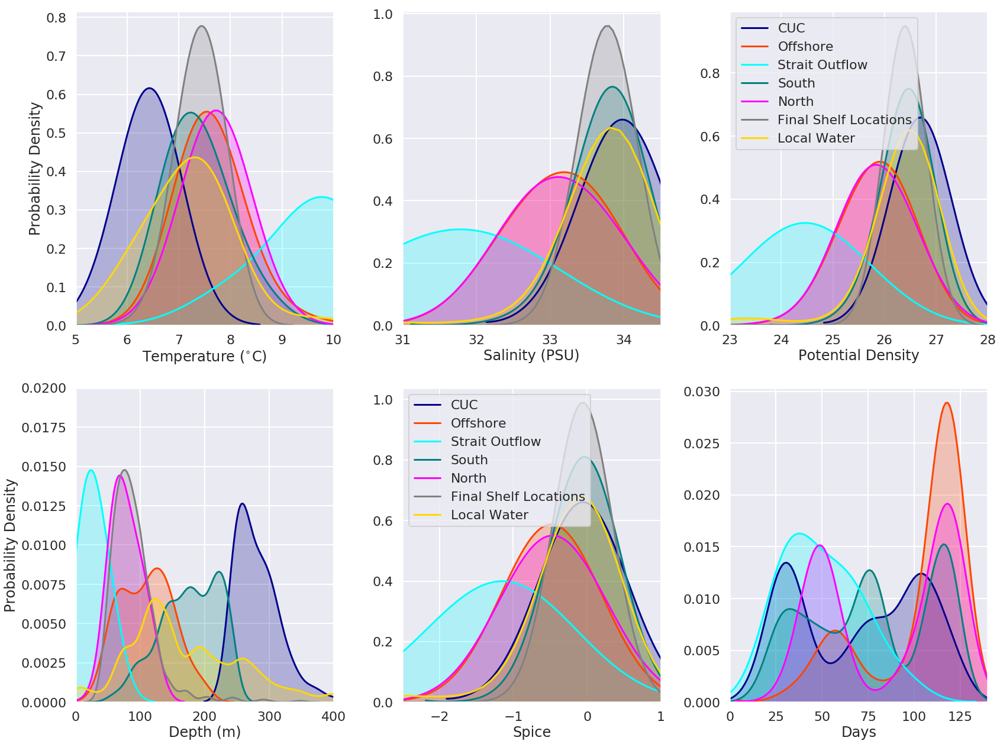

In [64]:
df = pd.DataFrame()

d = 1
local_percent = (ind_local.shape[0]/final_z.shape[0])*100

df['Density CUC']     = traj_rho_final_cuc
df['Temperature CUC'] = traj_tem_final_cuc
df['Salinity CUC']    = traj_sal_final_cuc
df['Spice CUC']       = spic_loc_cuc
df['Depth CUC']       = -traj_depth_final_cuc

dp = pd.DataFrame()

dp['Density OFF']     = traj_rho_final_off
dp['Temperature OFF'] = traj_tem_final_off
dp['Salinity OFF']    = traj_sal_final_off
dp['Spice OFF']       = spic_loc_off
dp['Depth OFF']       = -traj_depth_final_off

dg = pd.DataFrame()

dg['Density South']     = traj_rho_final_south
dg['Temperature South'] = traj_tem_final_south
dg['Salinity South']    = traj_sal_final_south
dg['Spice South']       = spic_loc_south
dg['Depth South']       = -traj_depth_final_south

dh = pd.DataFrame()

dh['Density Juan']     = traj_rho_final_juan
dh['Temperature Juan'] = traj_tem_final_juan
dh['Salinity Juan']    = traj_sal_final_juan
dh['Spice Juan']       = spic_loc_juan
dh['Depth Juan']       = -traj_depth_final_juan


dq = pd.DataFrame()

dq['Density North']     = traj_rho_final_north
dq['Temperature North'] = traj_tem_final_north
dq['Salinity North']    = traj_sal_final_north
dq['Spice North']       = spic_loc_north
dq['Depth North']       = -traj_depth_final_north


da = pd.DataFrame()

da['Density Init']     = traj_rho_init
da['Temperature Init'] = traj_tem_init
da['Salinity Init']    = traj_sal_init
da['Spice Init']       = spic_loc_init
da['Depth Init']       = -traj_depth_init

dj = pd.DataFrame()

dj['Density Local']     = traj_rho_final_local
dj['Temperature Local'] = traj_tem_final_local
dj['Salinity Local']    = traj_sal_final_local
dj['Spice Local']       = spic_loc_local
dj['Depth Local']       = -traj_depth_final_local


fig, (ax1,ax2) = plt.subplots(2,3, figsize=(24,18), sharey = False)

q = sns.kdeplot(df['Temperature CUC'], ax = ax1[0],bw=(cuc_percent**(-1./(d+4))),shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Temperature OFF'], ax = ax1[0], bw=(off_percent**(-1./(d+4))),shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Temperature Juan'], ax = ax1[0], bw=(juan_percent**(-1./(d+4))), shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Temperature South'], ax = ax1[0], bw=(south_percent**(-1./(d+4))),shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Temperature North'], ax = ax1[0], bw=(north_percent**(-1./(d+4))),shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Temperature Init'], ax = ax1[0], bw =(100**(-1./(d+4))), shade=True, color = 'Gray', label = None)

sns.kdeplot(dj['Temperature Local'], ax = ax1[0], bw =(local_percent**(-1./(d+4))), shade=True, color = 'Gold', label = None)


ax1[0].set_xlim(5,10)
ax1[0].set_xlabel('Temperature ($^{\circ}$C)')
ax1[0].set_ylabel('Probability Density')
ax1[0].get_legend().remove()
ax1[0].grid()


q = sns.kdeplot(df['Salinity CUC'], ax = ax1[1], bw=(cuc_percent**(-1./(d+4))),  shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Salinity OFF'], ax = ax1[1], bw = (off_percent**(-1./(d+4))),  shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Salinity Juan'], ax = ax1[1], bw = (juan_percent**(-1./(d+4))), shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Salinity South'], ax = ax1[1],  bw = (south_percent**(-1./(d+4))), shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Salinity North'], ax = ax1[1],bw = (north_percent**(-1./(d+4))), shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Salinity Init'], ax = ax1[1], bw = (100**(-1./(d+4))), shade=True, color = 'Gray',label = None)

sns.kdeplot(dj['Salinity Local'], ax = ax1[1], bw =(local_percent**(-1./(d+4))), shade=True, color = 'Gold', label = None)

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[1].set_xlim(31,34.5)
ax1[1].set_xlabel('Salinity (PSU)')
# ax2.set_ylabel('Density')
ax1[1].grid()
# ax1[2].legend()
ax1[1].get_legend().remove()


q = sns.kdeplot(df['Density CUC'], ax = ax1[2], bw=(cuc_percent**(-1./(d+4))), shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Density OFF'], ax = ax1[2],bw=(off_percent**(-1./(d+4))) ,shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Density Juan'], ax = ax1[2], bw=(juan_percent**(-1./(d+4))),shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Density South'], ax = ax1[2], bw=(south_percent**(-1./(d+4))), shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Density North'], ax = ax1[2], bw=(north_percent**(-1./(d+4))),shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Density Init'], ax = ax1[2], bw=(100**(-1./(d+4))), shade=True, color = 'Gray',label = 'Final Shelf Locations')

sns.kdeplot(dj['Density Local'], ax = ax1[2], bw =(local_percent**(-1./(d+4))), shade=True, color = 'Gold', label = 'Local Water')

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax1[2].set_xlim(23,28)
ax1[2].set_xlabel('Potential Density')
# ax2.set_ylabel('Density')
ax1[2].grid()
ax1[2].legend()
# ax1[2].get_legend().remove()


q = sns.kdeplot(df['Depth CUC'], ax = ax2[0], bw=((cuc_percent/10000000)**(-1./(d+4))), shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Depth OFF'], ax = ax2[0], bw=((off_percent/10000000)**(-1./(d+4))), shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Depth South'], ax = ax2[0], bw=((south_percent/10000000)**(-1./(d+4))), shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Depth Juan'], ax = ax2[0], bw=((juan_percent/10000000)**(-1./(d+4))),  shade=True, color = 'Cyan', label = 'Staright Outflow')

sns.kdeplot(dq['Depth North'], ax = ax2[0],  bw=((north_percent/10000000)**(-1./(d+4))), shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Depth Init'], ax = ax2[0], bw=((100/10000000)**(-1./(d+4))), shade=True, color = 'Gray', label = False)

sns.kdeplot(dj['Depth Local'], ax = ax2[0], bw =(local_percent/0.05**(-1./(d+4))), shade=True, color = 'Gold', label = None)

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 

# lims = [
#     np.min([ax1.get_xlim(), ax1.get_ylim()]),  # min of both axes
#     np.max([ax1.get_xlim(), ax1.get_ylim()]),  # max of both axes
# ]


# ax2[0].legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[0].set_xlabel('Depth (m)')
ax2[0].set_ylabel('Probability Density')
ax2[0].grid()

ax2[0].set_xlim(0,400)
ax2[0].set_ylim(0,0.02)
ax2[0].get_legend().remove()


q = sns.kdeplot(df['Spice CUC'], ax = ax2[1], bw=(cuc_percent**(-1./(d+4))), shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Spice OFF'], ax = ax2[1], bw=(off_percent**(-1./(d+4))), shade=True,color = 'orangered', label = 'Offshore')

sns.kdeplot(dh['Spice Juan'], ax = ax2[1], bw=(juan_percent**(-1./(d+4))), shade= True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dg['Spice South'], ax = ax2[1],  bw=(south_percent**(-1./(d+4))), shade=True, color = 'Teal', label = 'South')

sns.kdeplot(dq['Spice North'], ax = ax2[1],  bw=(north_percent**(-1./(d+4))),shade=True, color = 'Magenta', label = 'North')

sns.kdeplot(da['Spice Init'], ax = ax2[1], bw=(100**(-1./(d+4))), shade=True, color = 'Gray', label = 'Final Shelf Locations')

sns.kdeplot(dj['Spice Local'], ax = ax2[1], bw =(local_percent**(-1./(d+4))), shade=True, color = 'Gold', label = 'Local Water')


# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 


# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
ax2[1].set_xlim(-2.5,1)
ax2[1].set_xlabel('Spice')
# ax2.set_ylabel('Density')
ax2[1].grid()
ax2[1].legend()
# ax2[1].get_legend().remove()




df = pd.DataFrame()

df['Days CUC']     = traj_days_final_cuc


dp = pd.DataFrame()

dp['Days OFF']     = traj_days_final_off


dg = pd.DataFrame()

dg['Days South']     = traj_days_final_south


dh = pd.DataFrame()

dh['Days Juan']     = traj_days_final_juan

dz = pd.DataFrame()

dz['Days North']    = traj_days_final_north

dn = pd.DataFrame()

dn['Days Local'] = traj_days_final_local




q = sns.kdeplot(df['Days CUC'], ax = ax2[2],  bw=((cuc_percent/1000000)**(-1./(d+4))), shade=True, color = 'darkblue', label = 'CUC')

sns.kdeplot(dp['Days OFF'], ax = ax2[2], bw=((off_percent/1000000)**(-1./(d+4))), shade=True, color = 'orangered', label = 'Offshore')

sns.kdeplot(dg['Days South'], ax = ax2[2], bw=((south_percent/1000000)**(-1./(d+4))), shade= True, color = 'Teal', label = 'South')

sns.kdeplot(dh['Days Juan'], ax = ax2[2], bw=((juan_percent/1000000)**(-1./(d+4))), shade=True, color = 'Cyan', label = 'Strait Outflow')

sns.kdeplot(dz['Days North'], ax = ax2[2],  bw=((north_percent/1000000)**(-1./(d+4))), shade=True, color = 'Magenta', label = 'North')

# sns.kdeplot(dn['Days Local'], ax = ax2[2], bw =(local_percent/0.001**(-1./(d+4))), shade=True, color = 'Gold', label = None)

# p = sns.relplot(x="Observed_temp", y="Model_temp", hue="Depth (m)",  sizes=(1,10), data=df, legend='brief', palette=cmo.cm.amp_r)

# q.figure.axes[-1].yaxis.label.set_size(16)
# q.figure.axes[-1].tick_params(labelsize=16) 



# ax1.legend()
# ax1.tick_params(axis='both',labelsize =16)
# ax1.set_xlabel('Temperature', fontsize = 16)
# ax1.set_ylabel('Density', fontsize = 16)
# ax1.set_xlim(6,14)
ax2[2].set_xlabel('Days')
# ax1.set_ylabel('Probability Density')
ax2[2].grid()
ax2[2].get_legend().remove()
# ax2[2].legend()

ax2[2].set_xlim(0,140)

fig.tight_layout()


### We almost seem to have a time taken (days) distribution to be bi-modal except for the south water. The bimodality of the distribution can be assigned to the water either reaching directly to the final locations (location of isitialising ARIANE) or being trapped in the eddy. We need to look into the pathways for the reason of the south water to having three modes (any canyon or ctw)

In [87]:
sns.set_style('darkgrid')

(5, 12)

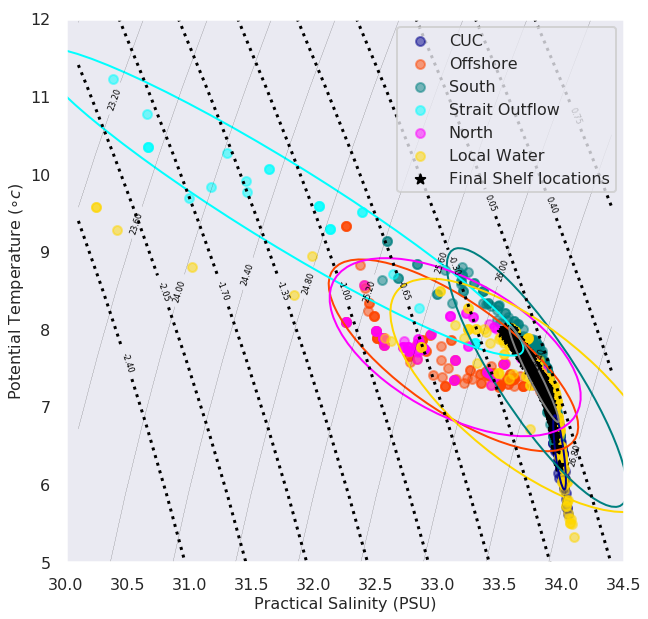

In [75]:
# colors = cmo.cm.phase(np.linspace(0, 1, 200))


# traj_sal_domain = traj_sal[traj_sal != 1.0100000202412861e+20]
# traj_tem_domain = traj_tem[traj_sal != 1.0100000202412861e+20]

# smin = np.nanmin(traj_sal_last)  - (0.01 * np.nanmin(traj_sal_last))
smin = 30
smax = np.nanmax(traj_sal_last)  + (0.01 * np.nanmax(traj_sal_last))
# tmin = np.nanmin(traj_tem_last) - (0.1 * np.nanmax(traj_tem_last))
tmin = 4
tmax = 12
# tmax = np.nanmax(traj_tem_last) + (0.1 * np.nanmax(traj_tem_last))
 
# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens_1 = np.empty((ydim,xdim))
spic_1 = np.empty((ydim,xdim))
SA = np.empty((xdim))
CT = np.empty((ydim)) 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        
        SA[i] = gsw.SA_from_SP(si[i], 0, np.mean(traj_lon), np.mean(traj_lat))

        CT[j] = gsw.CT_from_pt(si[i], ti[j])
        
        dens_1[j,i]=gsw.rho(SA[i],CT[j],0)
        
        spic_1[j,i] = gsw.spiciness0(SA[i],CT[j])
 
# Substract 1000 to convert to sigma-t
dens_1 = dens_1 - 1000;
 
# Plot data ***********************************************
fig1, ax = plt.subplots(1, 1, figsize=(10,10))
CS = ax.contour(si,ti,dens_1, np.arange(22.4,27,0.4), linestyles='dashed', linewidths = 0.2,colors='k')
CS1 = ax.contour(si,ti,spic_1,np.arange(-2.4,1,0.35), linestyles='dotted', colors='k')
plt.clabel(CS, fontsize=8, inline=1, fmt='%0.2f') # Label every second level
plt.clabel(CS1, fontsize=8, inline=1, fmt='%0.2f') # Label every second level



ax.scatter(traj_sal_final_cuc, traj_tem_final_cuc, s=80, alpha=0.5, c = 'darkblue', label = 'CUC')
sal_mean_cuc = np.mean(traj_sal_final_cuc)
tem_mean_cuc = np.mean(traj_tem_final_cuc)
cov_cuc = np.cov(traj_sal_final_cuc, traj_tem_final_cuc)
cuc_ell = get_cov_ellipse(cov_cuc, (sal_mean_cuc, tem_mean_cuc), 2,
                    ec='darkblue', fc = None)
cuc_ell.set_facecolor('none')
ax.add_artist(cuc_ell)




ax.scatter(traj_sal_final_off, traj_tem_final_off, s=80, alpha=0.5, c = 'orangered', label = 'Offshore')
sal_mean_off = np.mean(traj_sal_final_off)
tem_mean_off = np.mean(traj_tem_final_off)
cov_off = np.cov(traj_sal_final_off, traj_tem_final_off)
off_ell = get_cov_ellipse(cov_off, (sal_mean_off, tem_mean_off), 2,
                    ec='orangered', fc = None)
off_ell.set_facecolor('none')
ax.add_artist(off_ell)


traj_tem_final_north = traj_tem_final_north[traj_sal_final_north > 30]
traj_sal_final_north = traj_sal_final_north[traj_sal_final_north > 30]

ax.scatter(traj_sal_final_south, traj_tem_final_south, s=80, alpha=0.5, c= 'Teal', label = 'South')
sal_mean_south = np.mean(traj_sal_final_south)
tem_mean_south = np.mean(traj_tem_final_south)
cov_south = np.cov(traj_sal_final_south, traj_tem_final_south)
south_ell = get_cov_ellipse(cov_south, (sal_mean_south, tem_mean_south), 3,
                    ec='Teal', fc = None)
south_ell.set_facecolor('none')
ax.add_artist(south_ell)




# traj_tem_final_juan = traj_tem_final_juan[traj_sal_final_juan < 32.8]
# traj_sal_final_juan = traj_sal_final_juan[traj_sal_final_juan < 32.8]

ax.scatter(traj_sal_final_juan, traj_tem_final_juan, s=80, alpha=0.5, c = 'cyan', label = 'Strait Outflow')
sal_mean_juan = np.mean(traj_sal_final_juan)
tem_mean_juan = np.mean(traj_tem_final_juan)
cov_juan = np.cov(traj_sal_final_juan, traj_tem_final_juan)
juan_ell = get_cov_ellipse(cov_juan, (sal_mean_juan, tem_mean_juan), 2,
                    fc = None, ec='cyan')
juan_ell.set_facecolor('none')
ax.add_artist(juan_ell)




ax.scatter(traj_sal_final_north, traj_tem_final_north, s=80, alpha=0.5, c = 'Magenta', label = 'North')
sal_mean_north = np.mean(traj_sal_final_north)
tem_mean_north = np.mean(traj_tem_final_north)
cov_north = np.cov(traj_sal_final_north, traj_tem_final_north)
north_ell = get_cov_ellipse(cov_north, (sal_mean_north, tem_mean_north), 2,
                    ec='Magenta', fc = None)
north_ell.set_facecolor('none')
ax.add_artist(north_ell)

traj_tem_final_local = traj_tem_final_local[traj_sal_final_local > 30]
traj_sal_final_local = traj_sal_final_local[traj_sal_final_local > 30]

ax.scatter(traj_sal_final_local, traj_tem_final_local, s=80, alpha=0.5, c = 'Gold', label = 'Local Water')
sal_mean_local = np.mean(traj_sal_final_local)
tem_mean_local = np.mean(traj_tem_final_local)
cov_local = np.cov(traj_sal_final_local, traj_tem_final_local)
local_ell = get_cov_ellipse(cov_local, (sal_mean_local, tem_mean_local), 2,
                    ec='Gold', fc = None)
local_ell.set_facecolor('none')
ax.add_artist(local_ell)


traj_tem_init = traj_tem_init[traj_sal_init > 30]
traj_sal_init = traj_sal_init[traj_sal_init > 30]

ax.scatter(traj_sal_init, traj_tem_init, s=100, marker='*', c = 'k', label = "Final Shelf locations")#'chartreuse')
sal_mean_init = np.mean(traj_sal_init)
tem_mean_init = np.mean(traj_tem_init)
cov_init = np.cov(traj_sal_init, traj_tem_init)
init_ell = get_cov_ellipse(cov_init, (sal_mean_init, tem_mean_init), 2,
                    ec='gray', fc = None)
init_ell.set_facecolor('none')
ax.add_artist(init_ell)


ax.legend(loc = 'best', fontsize = 16)


 
ax.set_xlabel('Practical Salinity (PSU)', fontsize = 16)
ax.set_ylabel('Potential Temperature ($\circ c$)', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)
ax.set_xlim(30,34.5)
ax.set_ylim(5,12)


# legend = ax.legend(loc='upper right', fancybox=True, framealpha=0.25)

(5, 12)

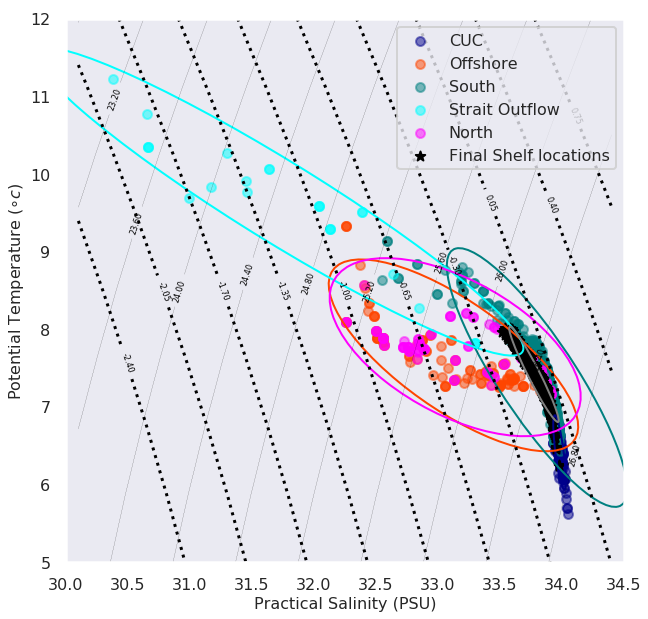

In [76]:
# colors = cmo.cm.phase(np.linspace(0, 1, 200))


# traj_sal_domain = traj_sal[traj_sal != 1.0100000202412861e+20]
# traj_tem_domain = traj_tem[traj_sal != 1.0100000202412861e+20]

# smin = np.nanmin(traj_sal_last)  - (0.01 * np.nanmin(traj_sal_last))
smin = 30
smax = np.nanmax(traj_sal_last)  + (0.01 * np.nanmax(traj_sal_last))
# tmin = np.nanmin(traj_tem_last) - (0.1 * np.nanmax(traj_tem_last))
tmin = 4
tmax = 12
# tmax = np.nanmax(traj_tem_last) + (0.1 * np.nanmax(traj_tem_last))
 
# Calculate how many gridcells we need in the x and y dimensions
xdim = int(round((smax-smin)/0.1+1,0))
ydim = int(round((tmax-tmin)+1,0))
 
# Create empty grid of zeros
dens_1 = np.empty((ydim,xdim))
spic_1 = np.empty((ydim,xdim))
SA = np.empty((xdim))
CT = np.empty((ydim)) 
# Create temp and salt vectors of appropiate dimensions
ti = np.linspace(1,ydim-1,ydim)+tmin
si = np.linspace(1,xdim-1,xdim)*0.1+smin
 
# Loop to fill in grid with densities
for j in range(0,int(ydim)):
    for i in range(0, int(xdim)):
        
        SA[i] = gsw.SA_from_SP(si[i], 0, np.mean(traj_lon), np.mean(traj_lat))

        CT[j] = gsw.CT_from_pt(si[i], ti[j])
        
        dens_1[j,i]=gsw.rho(SA[i],CT[j],0)
        
        spic_1[j,i] = gsw.spiciness0(SA[i],CT[j])
 
# Substract 1000 to convert to sigma-t
dens_1 = dens_1 - 1000;
 
# Plot data ***********************************************
fig1, ax = plt.subplots(1, 1, figsize=(10,10))
CS = ax.contour(si,ti,dens_1, np.arange(22.4,27,0.4), linestyles='dashed', linewidths = 0.2,colors='k')
CS1 = ax.contour(si,ti,spic_1,np.arange(-2.4,1,0.35), linestyles='dotted', colors='k')
plt.clabel(CS, fontsize=8, inline=1, fmt='%0.2f') # Label every second level
plt.clabel(CS1, fontsize=8, inline=1, fmt='%0.2f') # Label every second level



ax.scatter(traj_sal_final_cuc, traj_tem_final_cuc, s=80, alpha=0.5, c = 'darkblue', label = 'CUC')
sal_mean_cuc = np.mean(traj_sal_final_cuc)
tem_mean_cuc = np.mean(traj_tem_final_cuc)
cov_cuc = np.cov(traj_sal_final_cuc, traj_tem_final_cuc)
cuc_ell = get_cov_ellipse(cov_cuc, (sal_mean_cuc, tem_mean_cuc), 2,
                    ec='darkblue', fc = None)
cuc_ell.set_facecolor('none')
ax.add_artist(cuc_ell)




ax.scatter(traj_sal_final_off, traj_tem_final_off, s=80, alpha=0.5, c = 'orangered', label = 'Offshore')
sal_mean_off = np.mean(traj_sal_final_off)
tem_mean_off = np.mean(traj_tem_final_off)
cov_off = np.cov(traj_sal_final_off, traj_tem_final_off)
off_ell = get_cov_ellipse(cov_off, (sal_mean_off, tem_mean_off), 2,
                    ec='orangered', fc = None)
off_ell.set_facecolor('none')
ax.add_artist(off_ell)


traj_tem_final_north = traj_tem_final_north[traj_sal_final_north > 30]
traj_sal_final_north = traj_sal_final_north[traj_sal_final_north > 30]

ax.scatter(traj_sal_final_south, traj_tem_final_south, s=80, alpha=0.5, c= 'Teal', label = 'South')
sal_mean_south = np.mean(traj_sal_final_south)
tem_mean_south = np.mean(traj_tem_final_south)
cov_south = np.cov(traj_sal_final_south, traj_tem_final_south)
south_ell = get_cov_ellipse(cov_south, (sal_mean_south, tem_mean_south), 3,
                    ec='Teal', fc = None)
south_ell.set_facecolor('none')
ax.add_artist(south_ell)




# traj_tem_final_juan = traj_tem_final_juan[traj_sal_final_juan < 32.8]
# traj_sal_final_juan = traj_sal_final_juan[traj_sal_final_juan < 32.8]

ax.scatter(traj_sal_final_juan, traj_tem_final_juan, s=80, alpha=0.5, c = 'cyan', label = 'Strait Outflow')
sal_mean_juan = np.mean(traj_sal_final_juan)
tem_mean_juan = np.mean(traj_tem_final_juan)
cov_juan = np.cov(traj_sal_final_juan, traj_tem_final_juan)
juan_ell = get_cov_ellipse(cov_juan, (sal_mean_juan, tem_mean_juan), 2,
                    fc = None, ec='cyan')
juan_ell.set_facecolor('none')
ax.add_artist(juan_ell)




ax.scatter(traj_sal_final_north, traj_tem_final_north, s=80, alpha=0.5, c = 'Magenta', label = 'North')
sal_mean_north = np.mean(traj_sal_final_north)
tem_mean_north = np.mean(traj_tem_final_north)
cov_north = np.cov(traj_sal_final_north, traj_tem_final_north)
north_ell = get_cov_ellipse(cov_north, (sal_mean_north, tem_mean_north), 2,
                    ec='Magenta', fc = None)
north_ell.set_facecolor('none')
ax.add_artist(north_ell)

# traj_tem_final_local = traj_tem_final_local[traj_sal_final_local > 30]
# traj_sal_final_local = traj_sal_final_local[traj_sal_final_local > 30]

# ax.scatter(traj_sal_final_local, traj_tem_final_local, s=80, alpha=0.5, c = 'Gold', label = 'Local Water')
# sal_mean_local = np.mean(traj_sal_final_local)
# tem_mean_local = np.mean(traj_tem_final_local)
# cov_local = np.cov(traj_sal_final_local, traj_tem_final_local)
# local_ell = get_cov_ellipse(cov_local, (sal_mean_local, tem_mean_local), 2,
#                     ec='Gold', fc = None)
# local_ell.set_facecolor('none')
# ax.add_artist(local_ell)


traj_tem_init = traj_tem_init[traj_sal_init > 30]
traj_sal_init = traj_sal_init[traj_sal_init > 30]

ax.scatter(traj_sal_init, traj_tem_init, s=100, marker='*', c = 'k', label = "Final Shelf locations")#'chartreuse')
sal_mean_init = np.mean(traj_sal_init)
tem_mean_init = np.mean(traj_tem_init)
cov_init = np.cov(traj_sal_init, traj_tem_init)
init_ell = get_cov_ellipse(cov_init, (sal_mean_init, tem_mean_init), 2,
                    ec='gray', fc = None)
init_ell.set_facecolor('none')
ax.add_artist(init_ell)


ax.legend(loc = 'best', fontsize = 16)


 
ax.set_xlabel('Practical Salinity (PSU)', fontsize = 16)
ax.set_ylabel('Potential Temperature ($\circ c$)', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)
ax.set_xlim(30,34.5)
ax.set_ylim(5,12)


# legend = ax.legend(loc='upper right', fancybox=True, framealpha=0.25)

In [69]:
np.min(traj_tem_final_local)

4.1658024787902832

In [72]:
np.min(traj_sal_final_local)

20.28648567199707

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


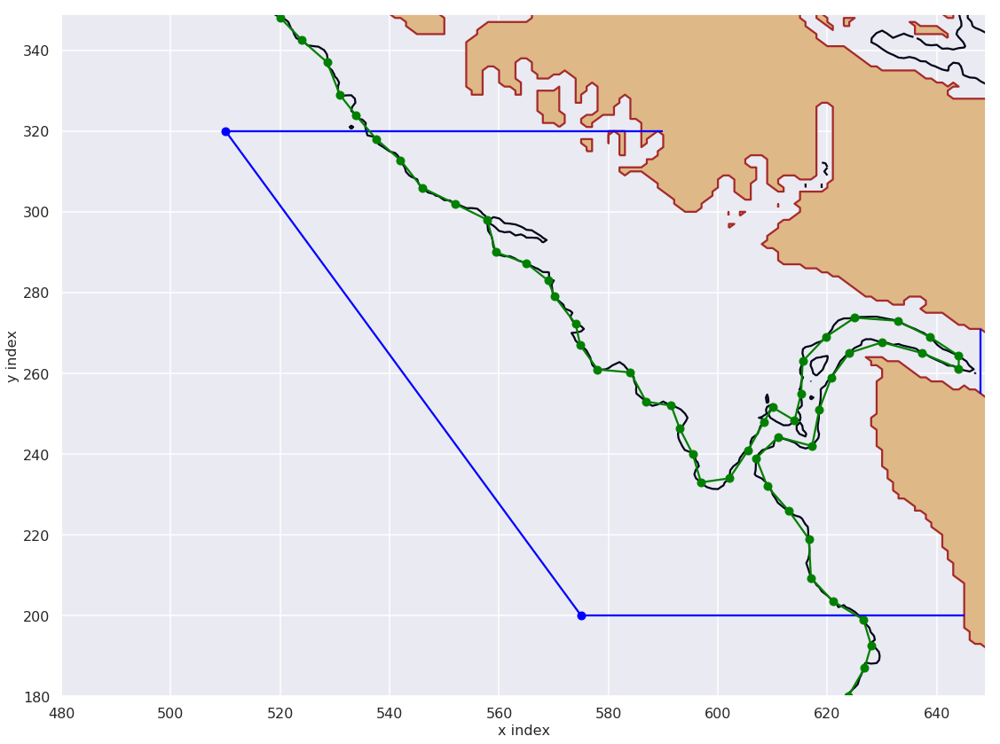

In [44]:



bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]




cmap=plt.cm.get_cmap('nipy_spectral')
#     cmap = plt.cm.get_cmap('gist_rainbow')
cmap.set_bad('#8b7765')
cmin = 0
cmax = 300

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
# CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
# CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
# CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)




ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

x = [510,575]
y = [320,200]
ax.plot(x, y , 'bo-')

xmin = x_wcvi_slice[np.int(np.min(np.unique(x1)))]-1
xmax = x_wcvi_slice[np.int(np.max(np.unique(x1)))]-1


ymin = y_wcvi_slice[np.int(np.min(np.unique(y1)))]-1
ymax  = y_wcvi_slice[np.int(np.max(np.unique(y1)))]-1


# x_1 = [xmin, xmax]
# y_1 = [ymin, ymin]
# ax.plot(x_1, y_1 , 'go-')

# x_2 = [xmin, xmax]
# y_2 = [ymax, ymax]
# ax.plot(x_2, y_2 , 'go-')

# x_3 = [xmin, xmin]
# y_3 = [ymin, ymax]
# ax.plot(x_3, y_3 , 'go-')

# x_4 = [xmax, xmax]
# y_4 = [ymin, ymax]
# ax.plot(x_4, y_4 , 'go-')

ax.vlines(x = 648, ymin = 255, ymax = 271, color = 'blue')

# ax.get_legend().remove()
# lon_LB08 = -125.4775
# lat_LB08 = 48.4217

# j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
#                                           lon,lat,grid='NEMO',tols=\
#                                           {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
#                                            'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

# ax.scatter(i,j, marker = 'o', c = 'red', s = 300, linewidths=100, label = 'Eddy region')

ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
ax.hlines(y = 320, xmin = 510, xmax=590, color = 'b')
ax.grid()

contour = CS.collections[0]
vs = contour.get_paths()[0].vertices


vert = CS.collections[0].get_paths()[0].vertices

x_200_wcvi = vert[:,0]
y_200_wcvi = vert[:,1]

# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

Line = ax.plot(x_200_wcvi[::10], y_200_wcvi[::10], 'go-')
fig.tight_layout()





In [27]:
final_age_days.shape

(946,)

In [28]:
IK = find_index(300)

PK = find_index(600)

LK = find_index(900)

JK = find_index(940)


total_indi = np.concatenate((IK,PK,LK,JK))#,LI, LP, MN))

In [29]:
total_indi.shape

(1807,)

In [30]:
cross_index = []


for i in np.unique(total_indi):

    if ((np.max(-traj_depth[:,i]) >= 200) & (np.min(-traj_depth[:,i]) < 200)) == True:
        
        cross_index = np.append(arr=cross_index, values=i)
        


In [31]:
cross_index.shape

(417,)

In [32]:
percentage = cross_index.shape[0]/final_age_days.shape[0]

print(percentage)

0.4408033826638478


### 44.1 Percent of the particles for the tru positive high spice particles were upwelled obeying both definitions

In [33]:
time_index = np.empty_like(cross_index)

for k in np.arange(cross_index.shape[0]):
    time_index[k] = np.min(np.argwhere(-traj_depth[:,cross_index[k].astype(int)] > 200))
    
    

In [34]:
np.save(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/numpy_arrays_saved/cross_index_all_down_high_spice.npy', arr=cross_index)

np.save(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/numpy_arrays_saved/time_index_all_down_high_spice.npy', arr=time_index)


In [88]:
cross_index = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/numpy_arrays_saved/cross_index_all_down_high_spice.npy')

time_index  = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/numpy_arrays_saved/time_index_all_down_high_spice.npy')

In [89]:
x_200_total = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/x_200_total_all_down_high_spice.npy')

y_200_total  = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/y_200_total_all_down_high_spice.npy')

# x_200_total = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/x_200_total_all_down_multiple.npy')

# y_200_total  = np.load(file='/data/ssahu/NEP36_2013_summer_hindcast/Ariane_files/y_200_total_all_down_multiple.npy')

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


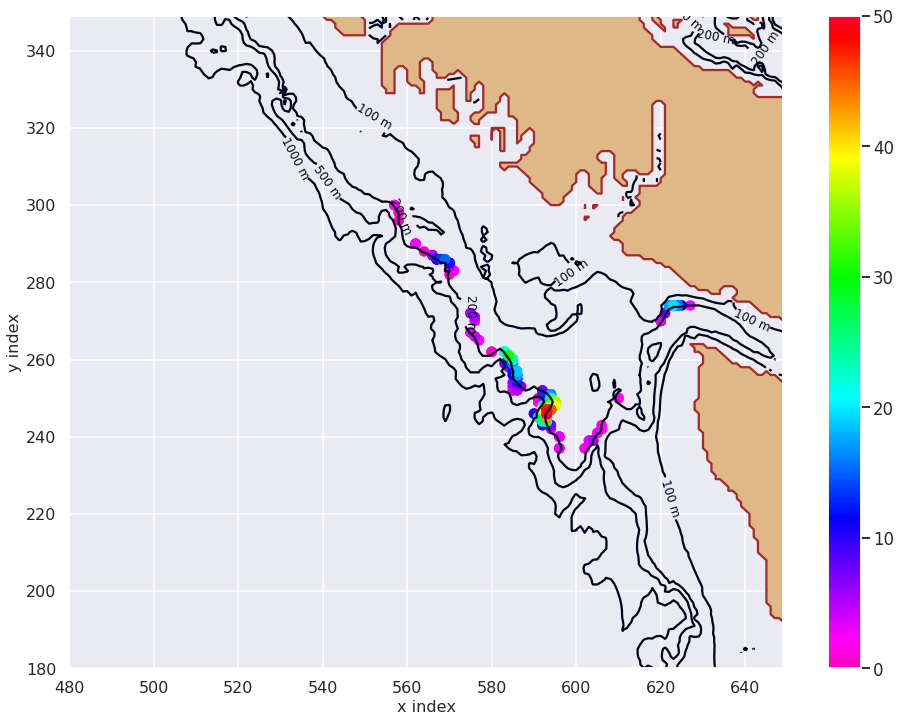

In [90]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





# cmap = plt.get_cmap(cmo.cm.turbid)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]

vmin = 0
vmax = 50


# cmap=plt.cm.get_cmap('nipy_spectral')
cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')


import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
# CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
# CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
# CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
# CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')


# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

q = density_scatter(x_200_total[~np.isnan(y_200_total)], y_200_total[~np.isnan(y_200_total)], ax= ax, bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)
# ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
# ax.hlines(y = 320, xmin = 520, xmax=590, color = 'b')
ax.grid()

# cbar = fig.colorbar(q, cax =ax)

# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

# Line = ax.plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')

# plt.colorbar(q)
# colorbar(q)

m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)
plt.colorbar(m)





/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


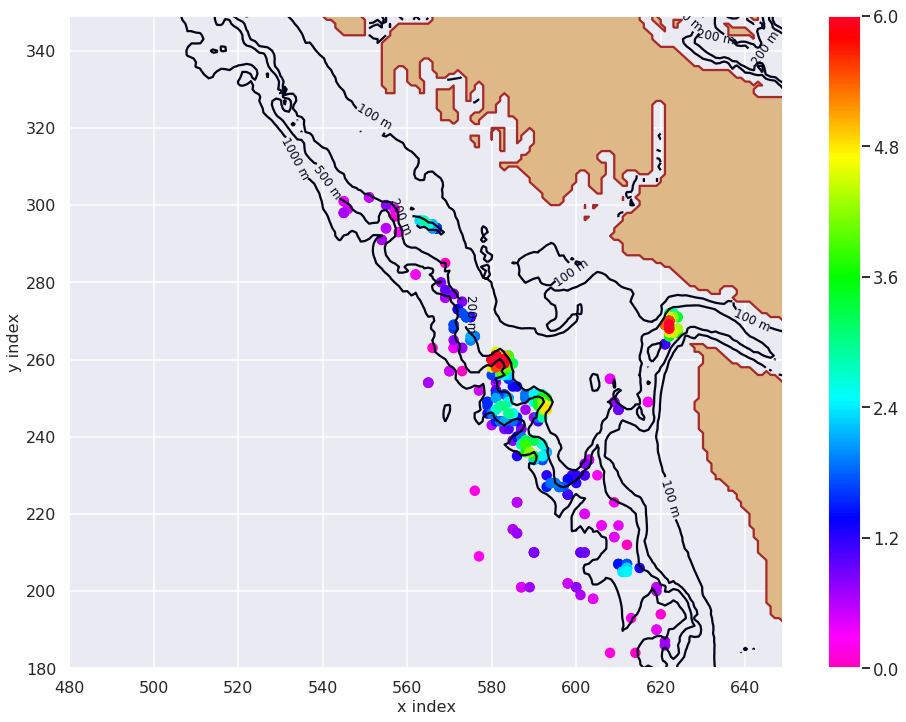

In [91]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





cmap = plt.get_cmap(cmo.cm.dense)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]




# cmap=plt.cm.get_cmap('nipy_spectral')
cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')
vmin = 0
vmax = 25

import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(16,12)); ax.grid()
# CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
# CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
# CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
# CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')

x = [520,575]
y = [320,200]
# ax.plot(x, y , 'bo-')



# for simplex in hull_barkley.simplices:
#     plt.plot(points[simplex, 0], points[simplex, 1])



# ax.plot(x_b, y_b , 'yo-')

xmin = x_wcvi_slice[np.int(np.min(np.unique(x1)))]-1
xmax = x_wcvi_slice[np.int(np.max(np.unique(x1)))]-1


ymin = y_wcvi_slice[np.int(np.min(np.unique(y1)))]-1
ymax  = y_wcvi_slice[np.int(np.max(np.unique(y1)))]-1


# x_1 = [xmin, xmax]
# y_1 = [ymin, ymin]
# ax.plot(x_1, y_1 , 'go-')

# x_2 = [xmin, xmax]
# y_2 = [ymax, ymax]
# ax.plot(x_2, y_2 , 'go-')

# x_3 = [xmin, xmin]
# y_3 = [ymin, ymax]
# ax.plot(x_3, y_3 , 'go-')

# x_4 = [xmax, xmax]
# y_4 = [ymin, ymax]
# ax.plot(x_4, y_4 , 'go-')

# ax.vlines(x = 635, ymin = 261, ymax = 279, color = 'blue')

# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

# ax.scatter(i,j, marker = 'o', c = 'red', s = 300, linewidths=100, label = 'Eddy region')

# x_up = []
# y_up = []

# for k in np.arange(cross_index.shape[0]):
#     y_p, x_p = geo_tools.find_closest_model_point(traj_lon[time_index[k].astype(int), cross_index[k].astype(int)],\
#                                           traj_lat[time_index[k].astype(int), cross_index[k].astype(int)],\
#                                           lon,lat,grid='NEMO',tols=\
#                                           {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
#                                            'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 
    
#     y_up = np.append(arr=y_up, values=y_p)
#     x_up = np.append(arr=x_up, values=x_p)
    

    
# ax.scatter(x_up,y_up, marker = '*', c = 'purple', s = 10, linewidths=2, label = 'Upwelled locations (200m crossings)')   

x_up = []
y_up = []

for k in np.arange(cross_index.shape[0]):
    y_p, x_p = geo_tools.find_closest_model_point(traj_lon[time_index[k].astype(int), cross_index[k].astype(int)],\
                                          traj_lat[time_index[k].astype(int), cross_index[k].astype(int)],\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 
    
    y_up = np.append(arr=y_up, values=y_p)
    x_up = np.append(arr=x_up, values=x_p)
    


q = density_scatter(x_up, y_up, ax= ax, bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)

q.autoscale(enable=True,axis='both')
# ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
# ax.hlines(y = 320, xmin = 520, xmax=590, color = 'b')
ax.grid()

# cbar = fig.colorbar(q, cax =ax)

# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

# Line = ax.plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')

# plt.colorbar(q)
# colorbar(q)

# import matplotlib.ticker as ticker

# def fmt(x, pos):
#     a = '{:.2f}'.format(x)
# #     b = int(b)
#     return r'${}$'.format(a)

m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)
cbar = fig.colorbar(m)#, format=ticker.FuncFormatter(fmt))


cbar.ax.set_yticklabels(np.around(a=np.linspace(start=(cbar.vmin/cross_index.shape[0])*100, \
                                    stop=(cbar.vmax/cross_index.shape[0])*100, num=6), decimals = 2))





/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


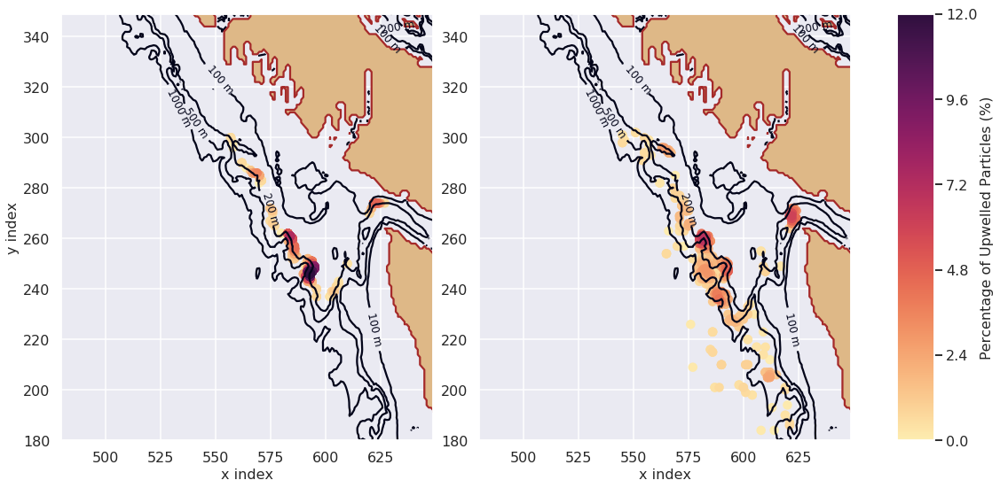

In [94]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





cmap = plt.get_cmap(cmo.cm.matter)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]




# cmap=plt.cm.get_cmap('nipy_spectral')
# cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')
vmin = 0
vmax = 50

import matplotlib as mpl

gridspec = {'width_ratios': [1, 1, 0.1]}

fig, ax = plt.subplots(1, 3, figsize=(16, 8), gridspec_kw=gridspec)


# fig, (ax1,ax) = plt.subplots(1, 2, figsize=(12,8), sharey=True); 

ax[0].grid()

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax[0].set_xlabel('x index', fontsize =16)
ax[0].set_ylabel('y index', fontsize = 16)
ax[0].tick_params(axis='both',labelsize =16)

ax[0].legend(loc = 'best')

viz_tools.plot_land_mask(ax[0], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax[0], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')


lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 


q = density_scatter(x_200_total[~np.isnan(y_200_total)], y_200_total[~np.isnan(y_200_total)], ax= ax[0], bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)

ax[0].grid()


# Line = ax[0].plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')



ax[1].grid()


CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)




ax[1].set_xlabel('x index', fontsize =16)
# ax.set_ylabel('y index', fontsize = 16)
ax[1].tick_params(axis='both',labelsize =16)



ax[1].legend(loc = 'best')

viz_tools.plot_land_mask(ax[1], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax[1], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')



# ax.vlines(x = 635, ymin = 261, ymax = 279, color = 'blue')

# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 


q = density_scatter(x_up, y_up, ax= ax[1], bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)

ax[1].grid()


# Line = ax[1].plot(x_200_wcvi[::1], y_200_wcvi[::1], 'm-')



m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)
# plt.colorbar(m, cax=ax[2])

cbar = fig.colorbar(m, cax=ax[2])#, format=ticker.FuncFormatter(fmt))


cbar.ax.set_yticklabels(np.around(a=np.linspace(start=(cbar.vmin/cross_index.shape[0])*100, \
                                    stop=(cbar.vmax/cross_index.shape[0])*100, num=6), decimals = 1))

cbar.set_label(label='Percentage of Upwelled Particles (%)', fontsize = 16)
cbar.ax.tick_params(labelsize=16)

fig.tight_layout(h_pad=0.01,w_pad=0.01)



### No crossing of the Tully canyon for these cluster points, these particles achieve the depth change at Barkley but majority of them cross the 200m isobath at Nitinat

### Final (initial) location of local water for low-low and high-high 

In [23]:
np.where(final_age_days == np.max(final_age_days))[0].shape[0]/final_z.shape[0]

0.42389006342494717

In [27]:
final_age.shape

(946,)

In [28]:
x2.shape

(946,)

In [57]:
north_ind_x = x2[np.where(final_age_days[(x_final < 580) & (y_final > 300)] == np.max(final_age_days))]
north_ind_y = y2[np.where(final_age_days[(x_final < 580) & (y_final > 300)] == np.max(final_age_days))]

# local_water_ind_x = np.setdiff1d(x2,north_ind_x, assume_unique=True)
# local_water_ind_y = np.setdiff1d(y2,north_ind_y, assume_unique=True)


cuc_ind_x  = x2[np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0]] == np.max(final_age_days))]

cuc_ind_y  = y2[np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0]] == np.max(final_age_days))]

south_ind_x = x2[np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0]] == np.max(final_age_days))]
south_ind_y = y2[np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0]] == np.max(final_age_days))]

off_ind_x = x2[off_ind.astype(int)]
off_ind_y = y2[off_ind.astype(int)]

juan_ind_x = x2[np.where(final_age_days[np.where((x_final > 648))[0]] == np.max(final_age_days))]
juan_ind_y = y2[np.where(final_age_days[np.where((x_final > 648))[0]] == np.max(final_age_days))]




In [65]:
local_water_x = x2[~((np.where(final_age_days[(x_final < 580) & (y_final > 300)] == np.max(final_age_days)))[0] & \
                 (np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0]] == np.max(final_age_days)))[0] & \
                    (np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0]] == np.max(final_age_days)))[0] & \
                    (off_ind.astype(int)) & \
                    np.where(final_age_days[np.where((x_final > 648))[0]] == np.max(final_age_days))[0])]

ValueError: operands could not be broadcast together with shapes (39,) (43,) 

In [87]:
local_water_x_1 = x2[~((np.where(final_age_days[(x_final < 580) & (y_final > 300)] == np.max(final_age_days)))[0])]

local_water_y_1 = y2[~((np.where(final_age_days[(x_final < 580) & (y_final > 300)] == np.max(final_age_days)))[0])]


local_water_x_2 = x2[~((np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0]] == np.max(final_age_days)))[0])]
local_water_y_2 = y2[~((np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]>28)[0]] == np.max(final_age_days)))[0])]


local_water_x_3 = x2[~((np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0]] == np.max(final_age_days)))[0])]
local_water_y_3 = y2[~((np.where(final_age_days[np.where(final_z[((x_final < 630) & (y_final < 200)) & \
                                      ((x_final > 580) & (y_final < 200))]<=28)[0]] == np.max(final_age_days)))[0])]


local_water_x_4 = x2[~(off_ind.astype(int))]
local_water_y_4 = y2[~(off_ind.astype(int))]

local_water_x_5 = x2[~(np.where(final_age_days[np.where((x_final > 648))[0]] == np.max(final_age_days))[0])]
local_water_y_5 = y2[~(np.where(final_age_days[np.where((x_final > 648))[0]] == np.max(final_age_days))[0])]

local_water_ind_x = np.concatenate((local_water_x_1, local_water_x_2, local_water_x_3, local_water_x_4, \
                                  local_water_x_5))
local_water_ind_y = np.concatenate((local_water_y_1, local_water_y_2, local_water_y_3, local_water_y_4, \
                                  local_water_y_5))

In [88]:
local_water_ind_x.shape[0]/final_z.shape[0]

0.3784355179704017

In [71]:
(np.where(final_age_days[(x_final < 580) & (y_final > 300)] == np.max(final_age_days)))[0]

array([ 0, 14, 16, 18, 21, 22, 23, 25, 27, 28, 29, 30, 31, 32, 33, 34, 37,
       42, 47, 49, 54, 55, 56, 57, 59, 61, 63, 71, 72, 73, 75, 76, 77, 78,
       83, 85, 87, 88, 89])

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


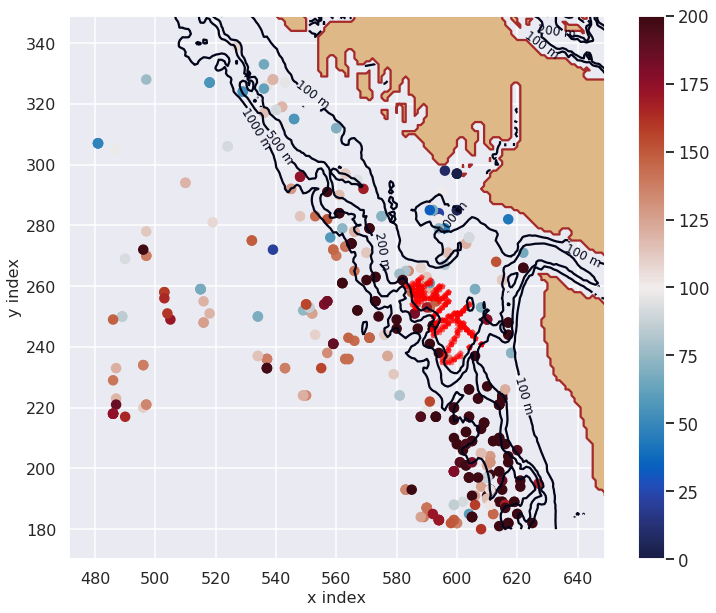

In [36]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





cmap = plt.get_cmap(cmo.cm.balance)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]

vmin = 0
vmax = 200


# cmap=plt.cm.get_cmap('nipy_spectral')
# cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')


import matplotlib as mpl
#     norm = mpl.colors.Normalize(vmin=cmin,vmax=cmax)

fig, ax = plt.subplots(1, 1, figsize=(12,10)); ax.grid()
# CS = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,200,10))
# CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], level = [0,100,200,500,1000])
# CLS = plt.clabel(CS, inline=3,fmt='%0.0f m', fontsize=12)
# CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax.contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax.set_xlabel('x index', fontsize =16)
ax.set_ylabel('y index', fontsize = 16)
ax.tick_params(axis='both',labelsize =16)


# ax.set_title('Particle track at depth \u2248 {d:.1f} m'.format(d = np.abs(traj_depth[0,part])), fontsize =16)
ax.legend(loc = 'best')

viz_tools.plot_land_mask(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax, bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')


# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 

# q = density_scatter(x_wcvi_slice[np.round(x_local, decimals=0).astype(int)-1], \
#                     y_wcvi_slice[np.round(y_local, decimals=0).astype(int)-1], ax= ax, bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)
# q = ax.scatter(x_wcvi_slice[np.round(local_water_ind_x[np.isnan(local_water_ind_x) == False], decimals=0).astype(int)-1], \
#                     y_wcvi_slice[np.round(local_water_ind_y[np.isnan(local_water_ind_y) == False], decimals=0).astype(int)-1], cmap = cmap , vmin = vmin, vmax = vmax)

q = ax.scatter(x_wcvi_slice[np.round(x_local_high, decimals=0).astype(int)-1], \
                    y_wcvi_slice[np.round(y_local_high, decimals=0).astype(int)-1], \
               c =  depth_local_high, cmap = cmap , vmin = vmin, vmax = vmax)

for k in np.arange(x1.shape[0]):
    ax.scatter(x_wcvi_slice[np.int(x_high[k]-1)],y_wcvi_slice[np.int(y_high[k]-1)], marker = '*', alpha=0.2, c = 'red', s = 10, linewidths=3)

# ax.hlines(y = 200, xmin = 575, xmax=645, color = 'b')
# ax.hlines(y = 320, xmin = 520, xmax=590, color = 'b')
ax.grid()

# cbar = fig.colorbar(q, cax =ax)

# for i in range(0, len(x_200_wcvi), 10):
#     plt.plot(x_200_wcvi[i:i+1], y_200_wcvi[i:i+1], 'mo-')
    

# Line = ax.plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')

# plt.colorbar(q)
# colorbar(q)

m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)
plt.colorbar(m)





In [89]:
-traj_depth_init[ind_local]

masked_array(data = [84.75727844238281 84.75727844238281 84.75727844238281 71.55553436279297
 100.62609100341797 100.62609100341797 71.55553436279297 71.55553436279297
 60.558807373046875 84.75727844238281 100.62609100341797 60.558807373046875
 84.75727844238281 100.62609100341797 84.75727844238281 100.62609100341797
 119.71409606933594 84.75727844238281 100.62609100341797 119.71409606933594
 84.75727844238281 119.71409606933594 119.71409606933594 119.71409606933594
 142.67788696289062 142.67788696289062 51.381935119628906
 60.558807373046875 51.381935119628906 60.558807373046875
 60.558807373046875 71.55553436279297 60.558807373046875 71.55553436279297
 84.75727844238281 84.75727844238281 84.75727844238281 84.75727844238281
 100.62609100341797 100.62609100341797 100.62609100341797
 119.71409606933594 119.71409606933594 100.62609100341797 84.75727844238281
 84.75727844238281 84.75727844238281 71.55553436279297 100.62609100341797
 84.75727844238281 84.75727844238281 71.55553436279297 51

/home/ssahu/anaconda3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


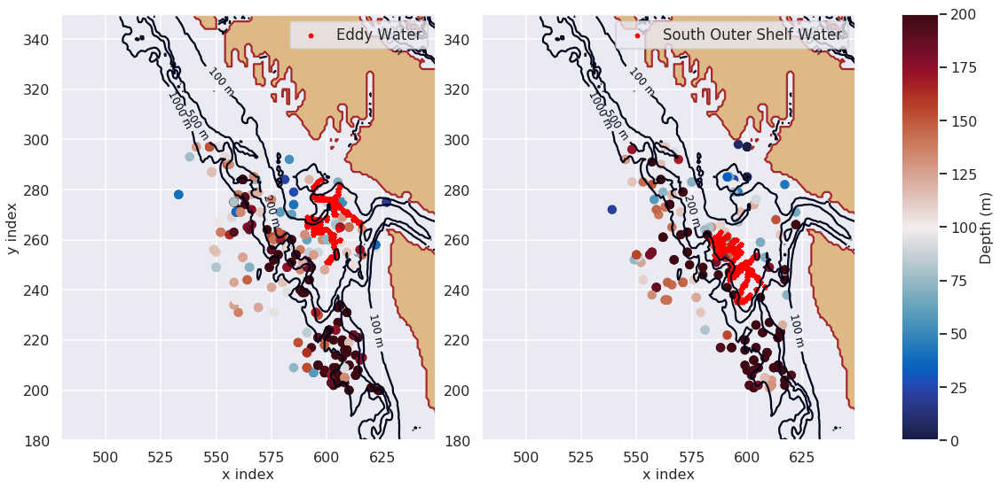

In [102]:
from scipy.interpolate import interpn
from mpl_toolkits.axes_grid1 import make_axes_locatable





cmap = plt.get_cmap(cmo.cm.balance)


bathy = nc.Dataset('/data/mdunphy/NEP036-N30-OUT/INV/Bathymetry_EastCoast_NEMO_R036_GEBCO_corr_v14.nc')

Z = bathy.variables['Bathymetry']


lon = bathy['nav_lon'][...]
lat = bathy['nav_lat'][...]




# cmap=plt.cm.get_cmap('nipy_spectral')
# cmap = plt.cm.get_cmap('gist_rainbow_r')
cmap.set_bad('#8b7765')
vmin = 0
vmax = 200

import matplotlib as mpl

gridspec = {'width_ratios': [1, 1, 0.1]}

fig, ax = plt.subplots(1, 3, figsize=(16, 8), gridspec_kw=gridspec)


# fig, (ax1,ax) = plt.subplots(1, 2, figsize=(12,8), sharey=True); 

ax[0].grid()

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)


CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[0].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)



ax[0].set_xlabel('x index', fontsize =16)
ax[0].set_ylabel('y index', fontsize = 16)
ax[0].tick_params(axis='both',labelsize =16)

ax[0].legend(loc = 'best')

viz_tools.plot_land_mask(ax[0], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax[0], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')


lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 


# q = density_scatter(x_200_total[~np.isnan(y_200_total)], y_200_total[~np.isnan(y_200_total)], ax= ax[0], bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)

q = ax[0].scatter(x_wcvi_slice[np.round(x_local_low_actual, decimals=0).astype(int)-1], \
                    y_wcvi_slice[np.round(y_local_low_actual, decimals=0).astype(int)-1], \
                  c =  depth_local_low_actual, cmap = cmap , vmin = vmin, vmax = vmax)

# for k in np.arange(x_low.shape[0]):
#     ax[0].scatter(x_wcvi_slice[np.int(x_low[k]-1)],y_wcvi_slice[np.int(y_low[k]-1)], marker = '*', c = 'red', s = 10, linewidths=3)



ax[0].scatter(x_wcvi_slice[(x_low[:]-1).astype(int)],y_wcvi_slice[(y_low[:]-1).astype(int)], marker = '*', c = 'red', s = 10, linewidths=3, label = 'Eddy Water')


ax[0].grid()
ax[0].set_ylim(180,350)
ax[0].legend(loc='best')

# Line = ax[0].plot(x_200_wcvi[::1], y_200_wcvi[::1], 'k-')



ax[1].grid()


CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(100,110,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(200,210,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(1000,1010,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)

CS1 = ax[1].contour(x_wcvi_slice,y_wcvi_slice,Z[y_wcvi_slice,x_wcvi_slice], np.arange(500,510,10))
CLS1 = plt.clabel(CS1, inline=3,fmt='%0.0f m', fontsize=12)




ax[1].set_xlabel('x index', fontsize =16)
# ax.set_ylabel('y index', fontsize = 16)
ax[1].tick_params(axis='both',labelsize =16)



ax[1].legend(loc = 'best')

viz_tools.plot_land_mask(ax[1], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='burlywood')
viz_tools.plot_coastline(ax[1], bathy, yslice=y_wcvi_slice, xslice=x_wcvi_slice, color='brown')



# ax.vlines(x = 635, ymin = 261, ymax = 279, color = 'blue')

# ax.get_legend().remove()
lon_LB08 = -125.4775
lat_LB08 = 48.4217

j, i = geo_tools.find_closest_model_point(lon_LB08,lat_LB08,\
                                          lon,lat,grid='NEMO',tols=\
                                          {'NEMO': {'tol_lon': 0.1, 'tol_lat': 0.1},\
                                           'GEM2.5': {'tol_lon': 0.1, 'tol_lat': 0.1}}) 


# q = density_scatter(x_wcvi_slice[np.round(x_local_high, decimals=0).astype(int)-1], \
#                     y_wcvi_slice[np.round(y_local_high, decimals=0).astype(int)-1], ax= ax[1], bins = [30,30], cmap = cmap , vmin = vmin, vmax = vmax)

q = ax[1].scatter(x_wcvi_slice[np.round(x_local_high_actual, decimals=0).astype(int)-1], \
                    y_wcvi_slice[np.round(y_local_high_actual, decimals=0).astype(int)-1],\
                  c =  depth_local_high_actual, cmap = cmap , vmin = vmin, vmax = vmax)

# for k in np.arange(x_high.shape[0]):
#     ax[1].scatter(x_wcvi_slice[np.int(x_high[k]-1)],y_wcvi_slice[np.int(y_high[k]-1)], marker = '*', c = 'red', s = 10, linewidths=3)


ax[1].scatter(x_wcvi_slice[(x_high[:]-1).astype(int)],y_wcvi_slice[(y_high[:]-1).astype(int)], marker = '*', c = 'red', s = 10, linewidths=3, label = 'South Outer Shelf Water')

# ax[1].scatter(x_wcvi_slice[(x_high[ind_local]-1).astype(int)],y_wcvi_slice[(y_high[ind_local]-1).astype(int)], marker = '*',\
#               c = -traj_depth_init[ind_local] , cmap = cmap, alpha = 0.2,   s = 50,  label = 'South Outer Shelf Water')


ax[1].grid()
ax[1].set_ylim(180,350)
ax[1].legend(loc='best')

# Line = ax[1].plot(x_200_wcvi[::1], y_200_wcvi[::1], 'm-')



m = cm.ScalarMappable(cmap=cmap)
m.set_array(q)
m.set_clim(vmin,vmax)


cbar = fig.colorbar(m, cax=ax[2])#, format=ticker.FuncFormatter(fmt))


# cbar.ax.set_yticklabels(np.around(a=np.linspace(start=(cbar.vmin/cross_index.shape[0])*100, \
#                                     stop=(cbar.vmax/cross_index.shape[0])*100, num=6), decimals = 1))

# cbar.set_label(label='Percentage of Upwelled Particles (%)', fontsize = 16)
cbar.set_label(label='Depth (m)', fontsize = 16)
cbar.ax.tick_params(labelsize=16)

# plt.show()

# ax[2].bar(r5, CUC, width=barWidth, color = 'darkblue', label='CUC')
# ax[2].bar(r3, OFF, width=barWidth, color = 'orangered',  label='Offshore')
# ax[2].bar(r1,  JUAN, width=barWidth, color = 'cyan', label='Strait Outflow')
# ax[2].bar(r4, SOUTH, width=barWidth, color = 'teal', label='South')
# ax[2].bar(r2, NORTH, width=barWidth, color = 'magenta', label='North')

# ax[2].set_ylabel('Percentage')
# # plt.title('For all the')
# ax[2].set_xticks((barWidth, 1+ barWidth, 2+ barWidth))
# ax[2].set_xticklabels(('Eddy Water', 'South Outer-Shelf'))

# # ax.set_xticks([r + barWidth for r in range(len(CUC))], ['Top 21m', '21 till 65m', '65 till 155m'])
# ax[2].legend(loc='best')

fig.tight_layout(h_pad=0.01,w_pad=0.01)



In [82]:
x1[ind_local]

masked_array(data = [ 108.01  108.01  108.01  107.01  107.01  108.01  109.01  110.01  118.01
  118.01  118.01  118.01  118.01  118.01  117.01  117.01  117.01  117.01
  117.01  117.01  116.01  116.01  115.01  113.01  113.01  112.01  125.01
  125.01  125.01  125.01  122.01  122.01  122.01  122.01  122.01  121.01
  121.01  119.01  119.01  119.01  117.01  117.01  116.01  117.01  118.01
  119.01  119.01  121.01  121.01  121.01  121.01  121.01  122.01  122.01
  122.01  122.01  122.01  122.01  123.01  123.01  121.01  121.01  121.01
  121.01  121.01  121.01  120.01  120.01  120.01  120.01  119.01  119.01
  119.01  119.01  118.01  118.01  117.01  117.01  117.01  117.01  117.01
  117.01  116.01  116.01  116.01  116.01  115.01  115.01  114.01  114.01
  114.01  114.01  115.01  115.01  115.01  115.01  116.01  116.01  117.01
  117.01  117.01  114.01  114.01  112.01  112.01  112.01  112.01  111.01
  110.01  110.01  109.01  109.01  109.01  106.01  106.01  106.01  106.01
  106.01  106.01  107.01  107.0

In [94]:
y_local_high_actual = y_local_high[np.where(y_wcvi_slice[y_local_high.astype(int)] > 200)]

x_local_high_actual = x_local_high[y_local_high_actual.astype(int)]

depth_local_high_actual = depth_local_high[np.where(y_wcvi_slice[y_local_high.astype(int)] > 200)]




In [78]:
depth_local_high_actual.shape[0]/final_z.shape[0]

0.34355179704016914

In [57]:
np.where(y_wcvi_slice[y_local_high.astype(int)] < 200)

(array([  2,   4,   8,   9,  12,  16,  17,  25,  29,  33,  35,  38,  54,
         55,  59,  60,  61,  66,  71,  85,  89, 102, 106, 116, 118, 133,
        136, 137, 139, 142, 150, 153, 156, 166, 169, 186, 191, 193, 197,
        214, 218, 220, 226, 227, 228, 229, 230, 231, 232, 261, 263, 265,
        267, 278, 281, 296, 298, 300, 304, 307, 310, 313, 332, 344, 346,
        356, 357, 360, 364, 378]),)

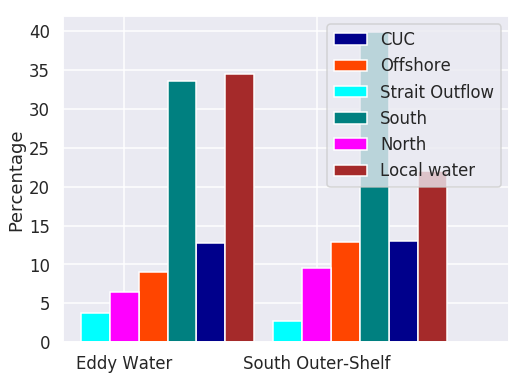

In [155]:
N = 2

local_percent_low = 100 - (cuc_percent_low + juan_percent_low + north_percent_low + south_percent_low +\
                          off_percent_low)
local_percent_high = 100 - (cuc_percent_high + juan_percent_high + north_percent_high + south_percent_high +\
                          off_percent_high)

CUC   = (cuc_percent_low, cuc_percent_high)
OFF   = [off_percent_low, off_percent_high]
NORTH = [north_percent_low, north_percent_high]
SOUTH = [south_percent_low, south_percent_high]
JUAN  = [juan_percent_low, juan_percent_high]
LOCAl = [local_percent_low, local_percent_high]


ind = np.arange(N) 
barWidth = 0.15   

# Set position of bar on X axis
r1 = np.arange(len(CUC))
r2 = [x + barWidth for x in r1]
r3 = [x + barWidth for x in r2]
r4 = [x + barWidth for x in r3]
r5 = [x + barWidth for x in r4]
r6 = [x + barWidth for x in r5]

fig, ax = plt.subplots(1, 1, figsize=(8,6))

ax.bar(r5, CUC, width=barWidth, color = 'darkblue', label='CUC')
ax.bar(r3, OFF, width=barWidth, color = 'orangered',  label='Offshore')
ax.bar(r1,  JUAN, width=barWidth, color = 'cyan', label='Strait Outflow')
ax.bar(r4, SOUTH, width=barWidth, color = 'teal', label='South')
ax.bar(r2, NORTH, width=barWidth, color = 'magenta', label='North')
ax.bar(r6, LOCAl, width=barWidth, color = 'brown', label='Local water')

ax.set_ylabel('Percentage')
# plt.title('For all the')
ax.set_xticks((barWidth, 1+ barWidth, 2+ barWidth))
ax.set_xticklabels(('Eddy Water', 'South Outer-Shelf'))

# ax.set_xticks([r + barWidth for r in range(len(CUC))], ['Top 21m', '21 till 65m', '65 till 155m'])
ax.legend(loc='best')

In [80]:
x2.shape

(946,)

In [81]:
off_ind.shape

(122,)

In [85]:
x2_local = np.empty_like(x2)



x2_local[off_ind.astype(int)] = np.nan

# x2_local = x2[(np.where(final_age_days == np.max(final_age_days))[0])]





In [87]:
x2_local.shape

(401,)

In [90]:
max_life_ind = np.array(np.where(final_age_days == np.max(final_age_days))[0])

# off_ind/

ind_local = np.setdiff1d(max_life_ind, off_ind, assume_unique= True)

x_local_high_actual = x2[ind_local]
y_local_high_actual = y2[ind_local]

depth_local_high_actual = -traj_depth_last[ind_local]


In [97]:
depth_local_high_actual.shape

(336,)

In [ ]:
x_lo

In [89]:
off_ind

array([   2.,    6.,   10.,   24.,   28.,   51.,   52.,   62.,   69.,
        107.,  109.,  114.,  118.,  123.,  187.,  229.,  233.,  248.,
        252.,  253.,  254.,  290.,  295.,  381.,  386.,  391.,  395.,
        414.,  415.,  416.,  419.,  420.,  421.,  431.,  432.,  435.,
        436.,  440.,  445.,  449.,  455.,  459.,  464.,  467.,  471.,
        482.,  483.,  486.,  487.,  491.,  495.,  513.,  517.,  525.,
        548.,  553.,  562.,  565.,  569.,  574.,  578.,  581.,  629.,
        633.,  637.,  643.,  647.,  651.,  655.,  660.,  664.,  668.,
        672.,  674.,  679.,  684.,  691.,  695.,  700.,  716.,  721.,
        726.,  731.,  733.,  735.,  737.,  739.,  741.,  744.,  749.,
        754.,  759.,  764.,  766.,  768.,  770.,  773.,  778.,  781.,
        784.,  786.,  789.,  794.,  797.,  802.,  807.,  811.,  813.,
        827.,  828.,  836.,  844.,  849.,  872.,  874.,  880.,  897.,
        902.,  913.,  920.,  923.,  944.])